# A Diffusion Model from Scratch in Pytorch

In this notebook I want to build a very simple (as few code as possible) Diffusion Model for generating car images. I will explain all the theoretical details in the YouTube video.


**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


# Link de github



## Investigating the dataset

As dataset we use the StandordCars Dataset, which consists of around 8000 images in the train set. Let's see if this is enough to get good results ;-)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
# Instala torchmetrics con soporte para métricas de imagen (incluye torch-fidelity)
!pip install -q torchmetrics[image]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 55.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 962.6/962.6 kB 48.3 MB/s eta 0:00:00


In [3]:
import os
import torch
import torchvision
import tarfile
import torch.nn as nn
import numpy as np
import torch.nn.functional as F
from torchvision.datasets.utils import download_url
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torchvision.transforms as tt
from torch.utils.data import random_split
from torchvision.utils import make_grid
from torchvision.transforms import ToTensor
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

matplotlib.rcParams['figure.facecolor'] = '#ffffff'

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/jutrera/stanford-car-dataset-by-classes-folder'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: sebastinacepeda
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/jutrera/stanford-car-dataset-by-classes-folder


100%|██████████| 1.83G/1.83G [00:29<00:00, 66.4MB/s]


In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
import os
import shutil

# Rutas de los directorios de origen y destino
ruta_origen = '/content/stanford-car-dataset-by-classes-folder'
ruta_destino = '/content/drive/MyDrive/SIS421/Dataset'

# Copia toda la carpeta y archivos al directorio de destino, incluso si ya existe
shutil.copytree(ruta_origen, ruta_destino, dirs_exist_ok=True)
print("Carpeta y archivos copiados correctamente.")

# Lista de archivos en el directorio de origen
# archivos = os.listdir(ruta_origen)

# Copia cada archivo al directorio de destino
# for archivo in archivos:
#     ruta_archivo_origen = os.path.join(ruta_origen, archivo)
#     ruta_archivo_destino = os.path.join(ruta_destino, archivo)
#     shutil.copy(ruta_archivo_origen, ruta_archivo_destino)
#     print(f"Archivo {archivo} copiado correctamente.")

# print("¡Copia de archivos completada!")

FileNotFoundError: [Errno 2] No such file or directory: '/content/stanford-car-dataset-by-classes-folder'

In [9]:
from torch.utils.data import Dataset

In [10]:
import os

DATA_DIR_TRAIN = '/content/drive/MyDrive/SIS421/Dataset/car_data/car_data/train'
train_classes = os.listdir(DATA_DIR_TRAIN)

DATA_DIR_TEST = '/content/drive/MyDrive/SIS421/Dataset/car_data/car_data/test'
test_classes = os.listdir(DATA_DIR_TEST)

train_classes[:5], test_classes[:5]

(['Audi A5 Coupe 2012',
  'Acura TL Sedan 2012',
  'Audi RS 4 Convertible 2008',
  'Audi S4 Sedan 2007',
  'Aston Martin V8 Vantage Coupe 2012'],
 ['Acura TL Type-S 2008',
  'AM General Hummer SUV 2000',
  'Acura RL Sedan 2012',
  'Acura TL Sedan 2012',
  'Acura Integra Type R 2001'])

In [11]:
# Tie the class indices to their names

def find_classes(dir):
    train_classes = os.listdir(dir)
    train_classes.sort()
    train_class_to_idx = {train_classes[i]: i for i in range(len(train_classes))}
    return train_classes, train_class_to_idx
    test_class_to_idx = {test_classes[i]: i for i in range(len(test_classes))}
    return test_classes, test_class_to_idx

train_classes, train_c_to_idx = find_classes(DATA_DIR_TRAIN)
test_classes, test_c_to_idx = find_classes(DATA_DIR_TEST)

In [12]:
train_classes[:5], test_classes[:5]

(['AM General Hummer SUV 2000',
  'Acura Integra Type R 2001',
  'Acura RL Sedan 2012',
  'Acura TL Sedan 2012',
  'Acura TL Type-S 2008'],
 ['AM General Hummer SUV 2000',
  'Acura Integra Type R 2001',
  'Acura RL Sedan 2012',
  'Acura TL Sedan 2012',
  'Acura TL Type-S 2008'])

In [13]:
len(train_classes), len(test_classes)

(196, 196)

In [14]:
train_classes == test_classes

True

In [15]:
# Tie the class indices to their names

def find_classes(dir):
    test_classes = os.listdir(dir)
    test_classes.sort()
    test_class_to_idx = {test_classes[i]: i for i in range(len(test_classes))}
    return test_classes, test_class_to_idx
test_classes, test_c_to_idx = find_classes(DATA_DIR_TEST)

In [16]:
def extract_class(Datasets):
  for vals in os.listdir(Datasets):
    print(vals)

In [17]:
extract_class(DATA_DIR_TRAIN)

Audi A5 Coupe 2012
Acura TL Sedan 2012
Audi RS 4 Convertible 2008
Audi S4 Sedan 2007
Aston Martin V8 Vantage Coupe 2012
Acura Integra Type R 2001
Acura TSX Sedan 2012
Acura RL Sedan 2012
Aston Martin V8 Vantage Convertible 2012
AM General Hummer SUV 2000
Audi 100 Wagon 1994
Audi 100 Sedan 1994
Acura TL Type-S 2008
Aston Martin Virage Convertible 2012
Audi R8 Coupe 2012
Aston Martin Virage Coupe 2012
Acura ZDX Hatchback 2012
BMW M5 Sedan 2010
Audi S4 Sedan 2012
BMW 1 Series Coupe 2012
Audi S5 Convertible 2012
Audi V8 Sedan 1994
BMW 1 Series Convertible 2012
Audi TT RS Coupe 2012
Audi TTS Coupe 2012
BMW 3 Series Wagon 2012
Audi S5 Coupe 2012
BMW 3 Series Sedan 2012
BMW ActiveHybrid 5 Sedan 2012
Audi S6 Sedan 2011
Audi TT Hatchback 2011
BMW 6 Series Convertible 2007
BMW M3 Coupe 2012
BMW X3 SUV 2012
BMW X6 SUV 2012
BMW M6 Convertible 2010
BMW X5 SUV 2007
BMW Z4 Convertible 2012
Cadillac SRX SUV 2012
Cadillac Escalade EXT Crew Cab 2007
Chevrolet Avalanche Crew Cab 2012
Bugatti Veyron 16.4 

In [18]:
train_dataset = ImageFolder(DATA_DIR_TRAIN, transform = ToTensor())
test_dataset = ImageFolder(DATA_DIR_TEST, transform = ToTensor())

In [19]:
len(train_dataset), len(test_dataset)

(8144, 8041)

In [20]:
image, label = train_dataset[0]
print('image_shape:', image.shape, 'Label:',label)

image_shape: torch.Size([3, 525, 700]) Label: 0


In [21]:
image, label = train_dataset[1]
print('image_shape:', image.shape, 'Label:',label)

image_shape: torch.Size([3, 64, 85]) Label: 0


In [22]:
def show_example(img, label):
    print('Label: ', train_dataset.classes[label], "("+str(label)+")")
    plt.imshow(img.permute(1, 2, 0))

Label:  Audi S5 Coupe 2012 (19)


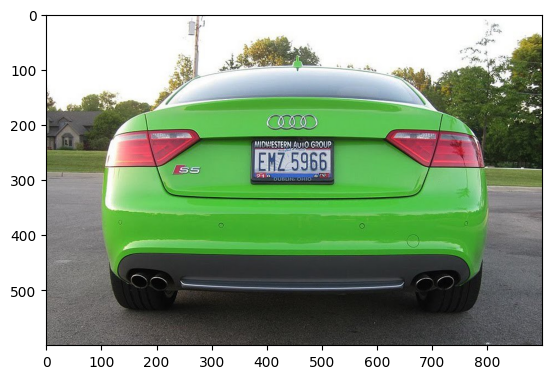

In [23]:
show_example(*train_dataset[777])

In [24]:
train_tfms = tt.Compose([tt.Resize((64, 64)),
                         tt.RandomRotation(0),
                         tt.ToTensor(),
                         tt.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
test_tfms = tt.Compose([tt.Resize((64, 64)),
                        tt.ToTensor(),
                        tt.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

In [25]:
train_dataset = ImageFolder(DATA_DIR_TRAIN, transform = train_tfms)
test_dataset = ImageFolder(DATA_DIR_TEST, transform = test_tfms)

In [26]:
# Pick the last 4 from the training dataset
train_dataset.classes[-5:-1]

['Volkswagen Golf Hatchback 2012',
 'Volvo 240 Sedan 1993',
 'Volvo C30 Hatchback 2012',
 'Volvo XC90 SUV 2007']

In [27]:
# Lift index 5: 9 in the test dataset
test_dataset.classes[5:9]

['Acura TSX Sedan 2012',
 'Acura ZDX Hatchback 2012',
 'Aston Martin V8 Vantage Convertible 2012',
 'Aston Martin V8 Vantage Coupe 2012']

In [28]:
len(train_dataset), len(test_dataset)

(8144, 8041)

In [29]:
image, label = train_dataset[0]
print('image_shape:', image.shape, 'Label:',label)

image_shape: torch.Size([3, 64, 64]) Label: 0


In [30]:
image, label = test_dataset[8040]
print('image_shape:', image.shape, 'Label:',label)

image_shape: torch.Size([3, 64, 64]) Label: 195


Label:  AM General Hummer SUV 2000 (0)


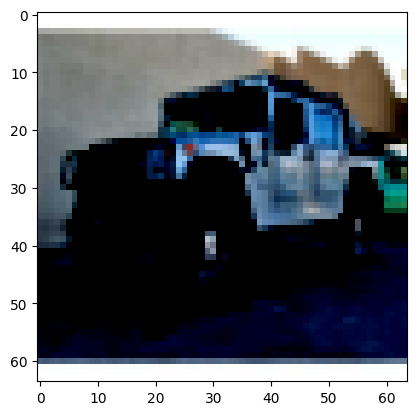

In [31]:
show_example(*train_dataset[0])

Label:  smart fortwo Convertible 2012 (195)


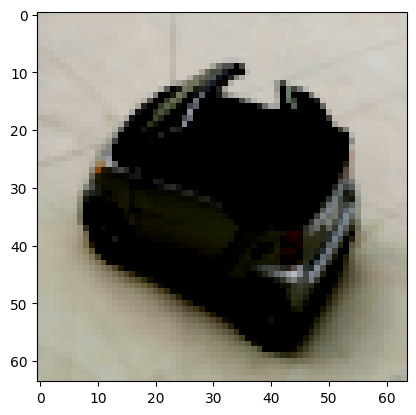

In [32]:
show_example(*test_dataset[8040])

In [33]:
random_seed = 42
torch.manual_seed(random_seed);

In [34]:
val_percent = 0.1
val_size = int(val_percent * len(train_dataset))
train_size = len(train_dataset) - val_size

train_ds, val_ds = random_split(train_dataset, [train_size, val_size])
len(train_ds), len(val_ds)

(7330, 814)

In [35]:
batch_size = 128

In [36]:
train_dl = DataLoader(train_ds, batch_size, shuffle = True, num_workers = 4, pin_memory = True)
val_dl = DataLoader(val_ds, batch_size * 2, num_workers = 4, pin_memory=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [37]:
def show_batch(dl):
  for images, labels in dl:
    fig, ax = plt.subplots(figsize = (12,6))
    ax.set_xticks([]), ax.set_yticks([])
    ax.imshow(make_grid(images, nrow=16).permute(1,2,0))
    break

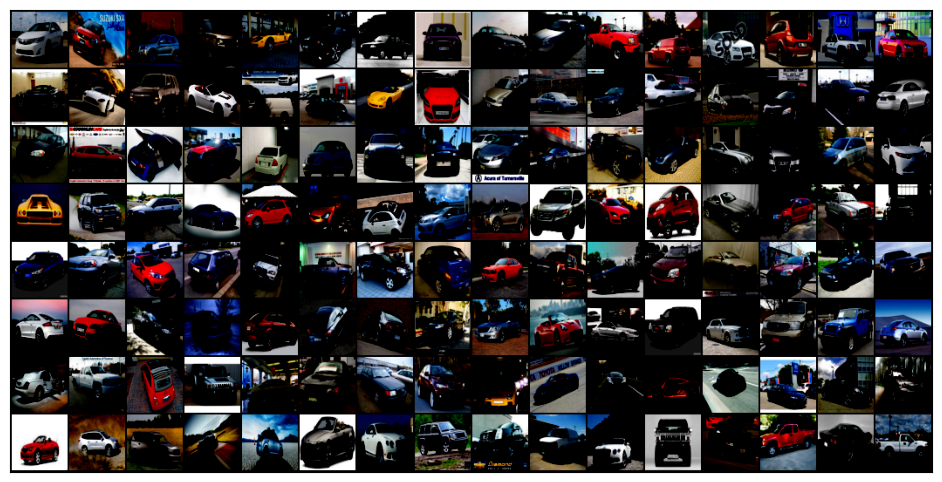

In [38]:
show_batch(train_dl);

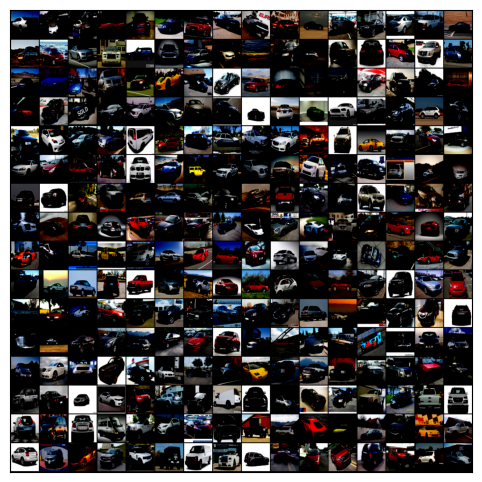

In [39]:
show_batch(val_dl);

In [ ]:
for images, labels in train_dl:
  print('images.shape:', images.shape)
  print('label.shape:', labels.shape)

  # out = simple_model(images)
  # print('out.shape:', out.shape)
  break

images.shape: torch.Size([128, 3, 64, 64])
label.shape: torch.Size([128])


In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

def show_images(ds_actual, num_samples=20, cols=4):
  """ Plots some samples from the dataset """
  plt.figure(figsize=(15,15))
  for i, (img, label) in enumerate(ds_actual):
    # print(img.shape)
    if i == num_samples:
      break
    plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
    plt.imshow(img[0])

# data = torchvision.datasets.StanfordCars(root=".", download=True)
# show_images(data)


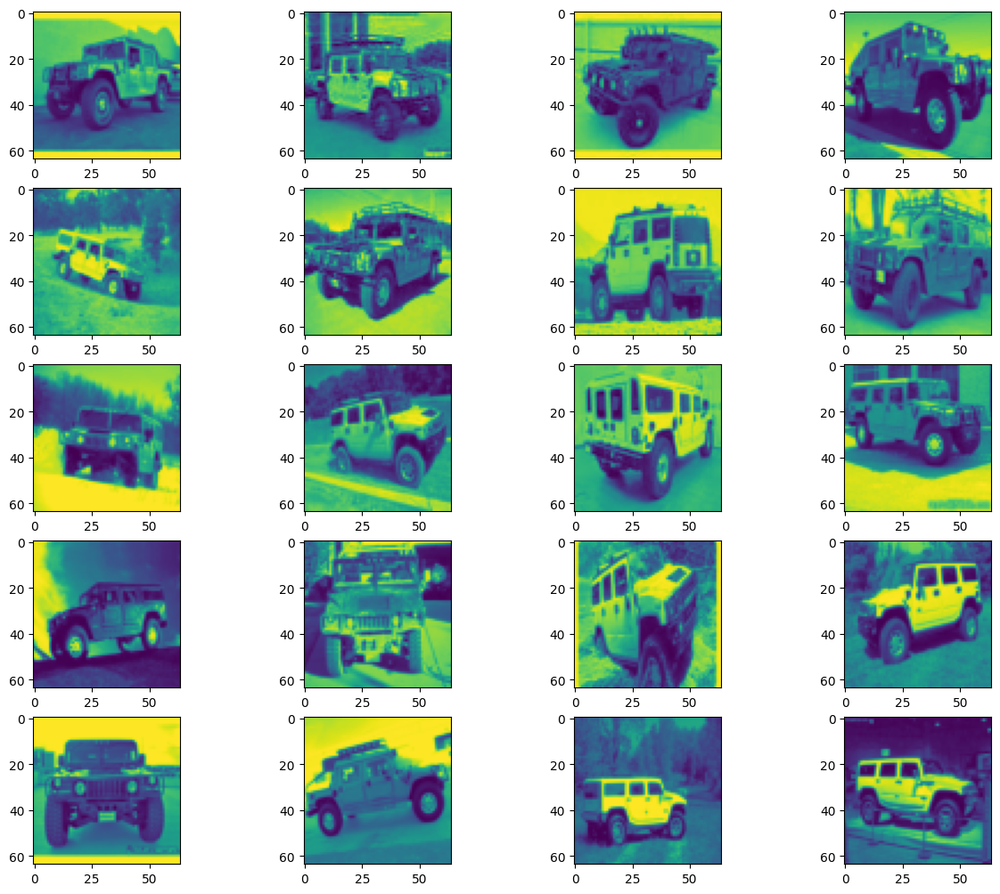

In [ ]:
show_images(train_dataset)

Later in this notebook we will do some additional modifications to this dataset, for example make the images smaller, convert them to tensors ect.

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [ ]:
import torch.nn.functional as F

#define bta intermola entre 2 valores como timesteps le den
def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

Let's test it on our dataset ...

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    train_dir = "/content/drive/MyDrive/SIS421/Dataset/car_data/car_data/train"

    test_dir = "/content/drive/MyDrive/SIS421/Dataset/car_data/car_data/test"


    train_dataset = datasets.ImageFolder(root=train_dir, transform=data_transform)
    test_dataset  = datasets.ImageFolder(root=test_dir, transform=data_transform)

    full_dataset = torch.utils.data.ConcatDataset([train_dataset, test_dataset])

    return full_dataset

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image))

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

In [ ]:
images.shape

torch.Size([128, 3, 64, 64])

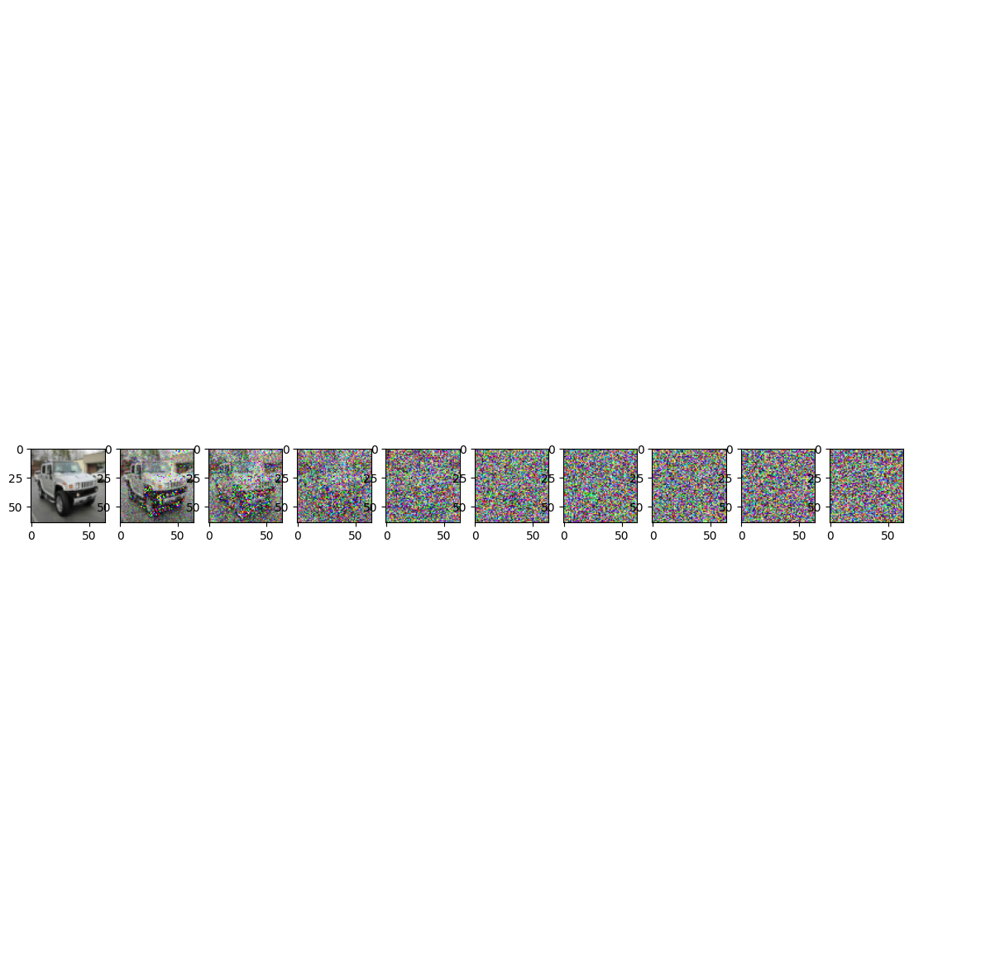

In [ ]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(images, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [ ]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False, is_concat=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        self.is_concat = is_concat
        if up:
            # Si estamos concatenando (en el decoder), se duplican los canales
            input_channels = in_ch * 2 if is_concat else in_ch
            self.conv1 = nn.Conv2d(input_channels, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()

    def forward(self, x, t):
        h = self.bnorm1(self.relu(self.conv1(x)))
        time_emb = self.relu(self.time_mlp(t))
        time_emb = time_emb[(..., ) + (None,) * 2]
        h = h + time_emb
        h = self.bnorm2(self.relu(self.conv2(h)))
        return self.transform(h)



class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self, image_channels = 3, out_dim = 3, time_emb_dim = 32):
        super().__init__()



        # Canales para resolución 64x64 (hasta 8x8)
        down_channels = (64, 128, 256, 512)
        up_channels = (512, 256, 128, 64)


        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([
            Block(down_channels[i], down_channels[i+1], time_emb_dim, up=False)
            for i in range(len(down_channels) - 1)
        ])

        # Upsample
        self.ups = nn.ModuleList([
          Block(up_channels[i], up_channels[i + 1], time_emb_dim, up=True, is_concat=True)
          for i in range(len(up_channels) - 1)
        ])

        # Edit: Corrected a bug found by Jakub C (see YouTube comment)
        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)




    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residuals = []

        for down in self.downs:
            x = down(x, t)
            residuals.append(x)

        for up in self.ups:
            res = residuals.pop()
            # Redimensionar residual si es necesario
            if res.shape[2:] != x.shape[2:]:
                res = torch.nn.functional.interpolate(res, size=x.shape[2:], mode='nearest')
            x = torch.cat((x, res), dim=1)
            x = up(x, t)

        return self.output(x)
"""
model = SimpleUnet()
print("Num params: ", sum(p.numel() for p in model.parameters()))
model
"""

model = SimpleUnet()
x = torch.randn(8, 3, 64, 64)  # batch de 8 imágenes RGB de 64x64
t = torch.randint(0, 1000, (8,))
out = model(x, t)
print("Output shape:", out.shape)  # Debe ser [8, 3, 64, 64]


Output shape: torch.Size([8, 3, 64, 64])



**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [ ]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [ ]:
@torch.no_grad()
def sample(model, n, img_size=64, channels=3, T=300, device="cuda"):
    model.eval()
    x = torch.randn((n, channels, img_size, img_size)).to(device)

    for t in reversed(range(T)):
        t_tensor = (torch.ones(n) * t).long().to(device)
        beta_t = betas[t].to(device)
        sqrt_one_minus_alphas_cumprod_t = sqrt_one_minus_alphas_cumprod[t].to(device)
        sqrt_recip_alphas_t = (1.0 / torch.sqrt(alphas[t])).to(device)

        model_mean = sqrt_recip_alphas_t * (x - beta_t / sqrt_one_minus_alphas_cumprod_t * model(x, t_tensor))

        if t > 0:
            noise = torch.randn_like(x)
            sigma_t = torch.sqrt(beta_t)
            x = model_mean + sigma_t * noise
        else:
            x = model_mean

    x = torch.clamp(x, 0.0, 1.0)
    return x

@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

## Training

In [ ]:
model

SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

In [ ]:
#Ruta dek checkpoint
import os

checkpoint_dir = "/content/drive/MyDrive/SIS421/Dataset/Checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)


In [ ]:
#Checkpoint
import torch

def save_checkpoint(model, optimizer, epoch, loss, filename="checkpoint.pth"):
    checkpoint = {
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'epoch': epoch,
        'loss': loss
    }
    torch.save(checkpoint, os.path.join(checkpoint_dir, filename))
    print(f"✅ Checkpoint guardado en epoch {epoch} con loss {loss:.4f}")

def load_checkpoint(model, optimizer, filename="checkpoint.pth"):
    checkpoint = torch.load(os.path.join(checkpoint_dir, filename))
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    print(f"📦 Checkpoint cargado desde epoch {epoch} con loss {loss:.4f}")
    return epoch, loss


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

Epoch 0 | step 000 Loss: 0.8079039454460144 


KeyboardInterrupt: 

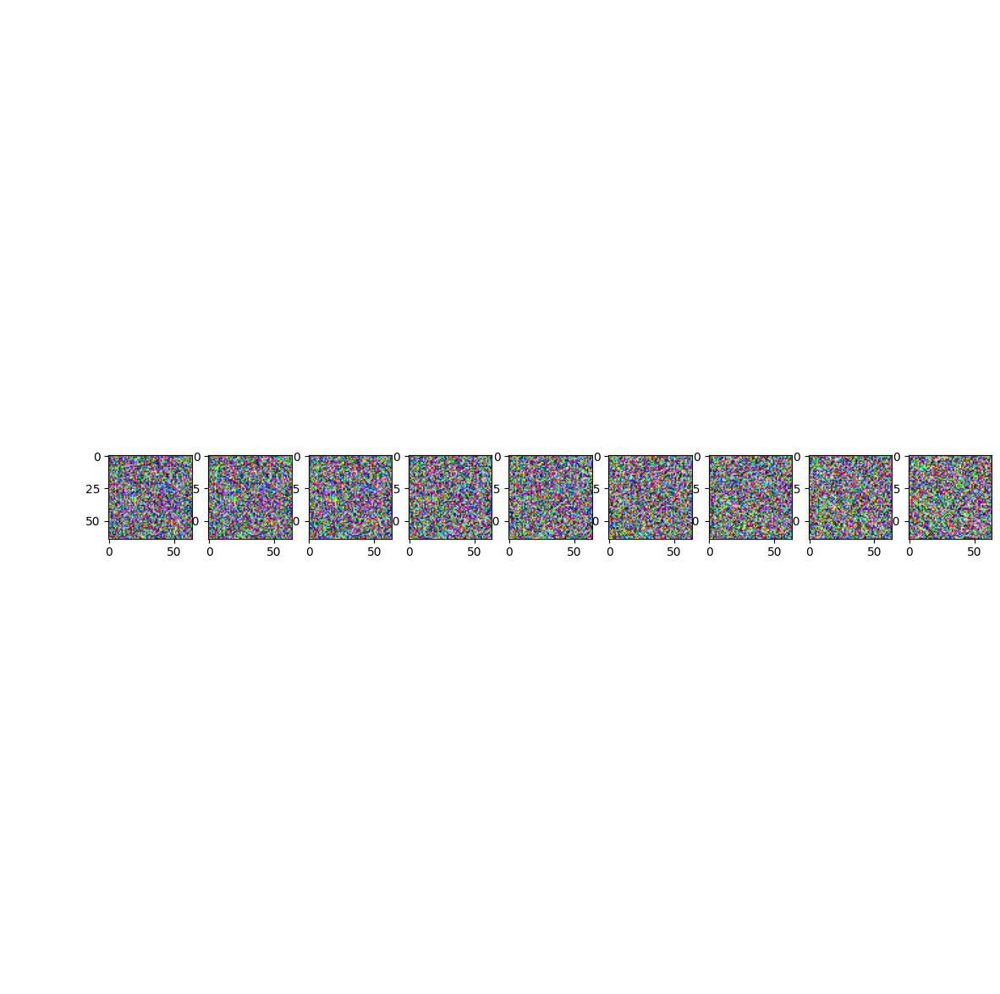

In [ ]:
import torchmetrics.image.fid
from torch.optim import Adam
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore
import torchvision.transforms as transforms


device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 50 # Try more!
best_loss = float('inf')

for epoch in range(epochs):
    for step, (x, _) in enumerate(dataloader):
      x = x.to(device)


      optimizer.zero_grad()

      #print(type(batch), len(batch))
      #print(type(batch[0]), batch[0].shape if isinstance(batch[0], torch.Tensor) else batch[0])
      #break

      t = torch.randint(0, T, (x.size(0),), device=device).long()
      loss = get_loss(model, x, t)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()

    # Guardar el mejor checkpoint
    if loss.item() < best_loss:
      best_loss = loss.item()
      save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar uno cada 10 épocas
    if epoch % 10 == 0:
      save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

    # Inicializa métricas solo una vez
    if epoch == 0:
      fid_metric = FrechetInceptionDistance(feature=2048).to(device)
      is_metric = InceptionScore().to(device)

    # Solo evaluar cada 10 épocas (o cuando quieras)
    if epoch % 10 == 0:
      model.eval()
      with torch.no_grad():
          num_samples = 100  # Puedes aumentar si tienes capacidad

          # === REAL IMAGES ===
          real_images = []
          for i, (real_batch, _) in enumerate(dataloader):
              real_images.append(real_batch)
              if len(real_images) * real_batch.size(0) >= num_samples:
                break
          real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

          # === FAKE IMAGES ===
          fake_images = model.sample(num_samples)  # Ajusta según cómo generes imágenes
          fake_images = fake_images.to(device)

          # Resize a 299x299 para Inception
          transform = transforms.Resize((299, 299))
          real_images = transform(real_images)
          fake_images = transform(fake_images)

          # Calcular FID
          fid_metric.reset()
          fid_metric.update(real_images, real=True)
          fid_metric.update(fake_images, real=False)
          fid_score = fid_metric.compute().item()

          # Calcular IS
          is_metric.reset()
          is_metric.update(fake_images)
          is_mean, is_std = is_metric.compute()
          is_mean = is_mean.item()
          is_std = is_std.item()

          print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")
      model.train()

In [ ]:
def preprocess_for_fid(images):
    # Escalar a [0, 255] y convertir a uint8
    images = (images * 255).clamp(0, 255).to(torch.uint8)
    return images


Epoch 0 | Step 000 | Loss: 0.1902


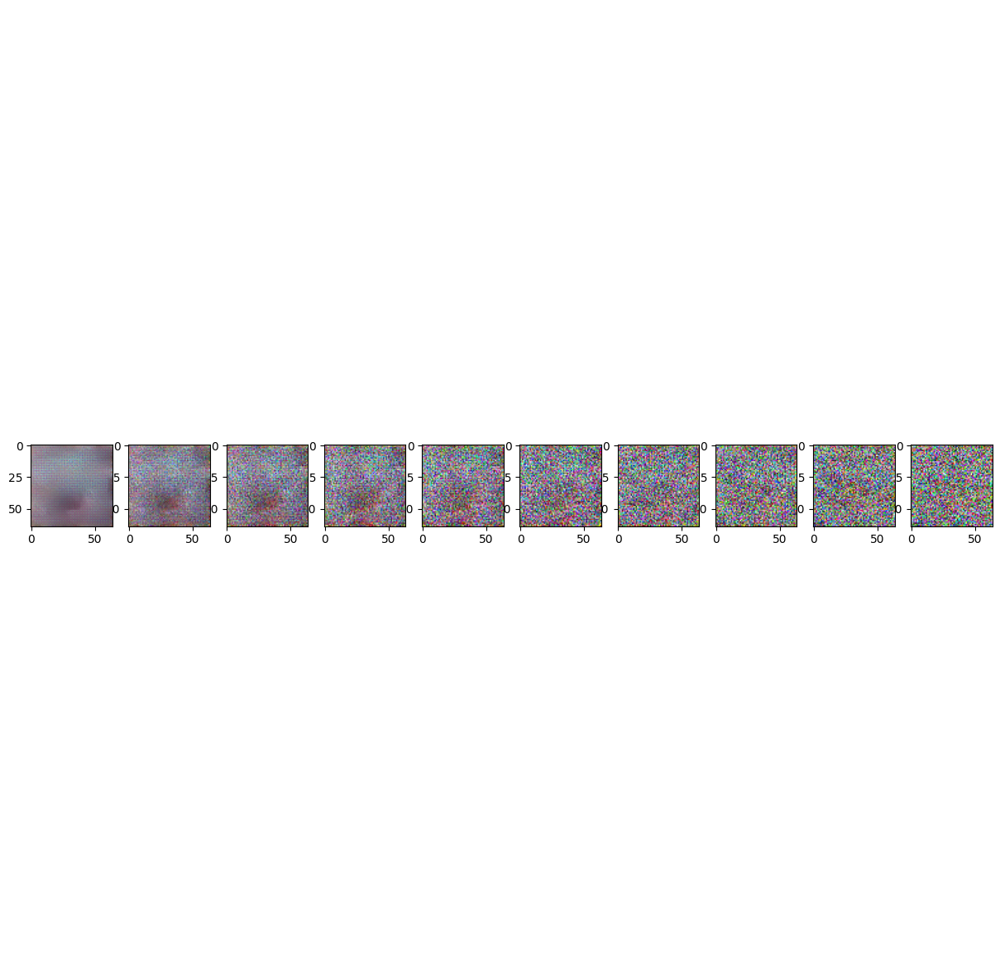

✅ Checkpoint guardado en epoch 0 con loss 0.1852
✅ Checkpoint guardado en epoch 0 con loss 0.1852
[Epoch 0] FID: 366.5463 | IS: 1.8054 ± 0.1746
✅ Checkpoint guardado en epoch 1 con loss 0.1718
✅ Checkpoint guardado en epoch 3 con loss 0.1645
✅ Checkpoint guardado en epoch 4 con loss 0.1539
Epoch 5 | Step 000 | Loss: 0.1614


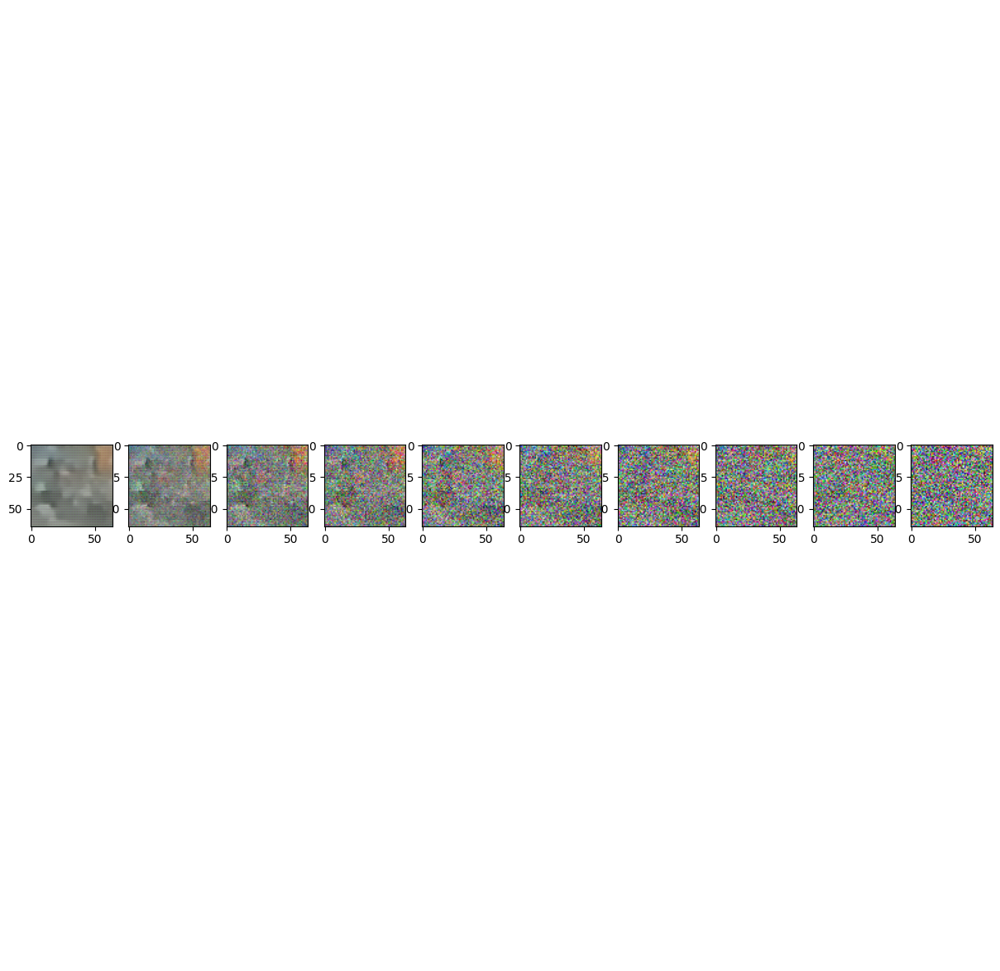

✅ Checkpoint guardado en epoch 6 con loss 0.1514
Epoch 10 | Step 000 | Loss: 0.1453


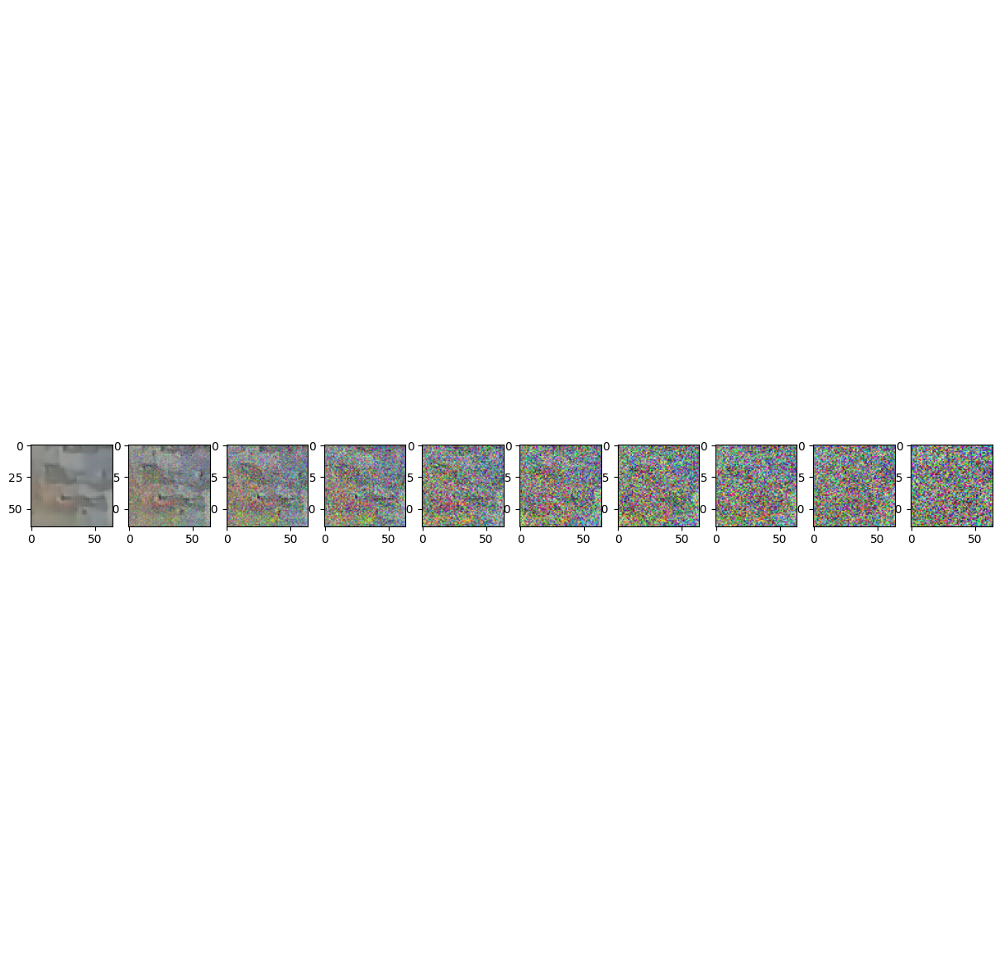

✅ Checkpoint guardado en epoch 10 con loss 0.1436
✅ Checkpoint guardado en epoch 10 con loss 0.1436
[Epoch 10] FID: 273.6150 | IS: 2.0828 ± 0.2518
✅ Checkpoint guardado en epoch 12 con loss 0.1361
Epoch 15 | Step 000 | Loss: 0.1327


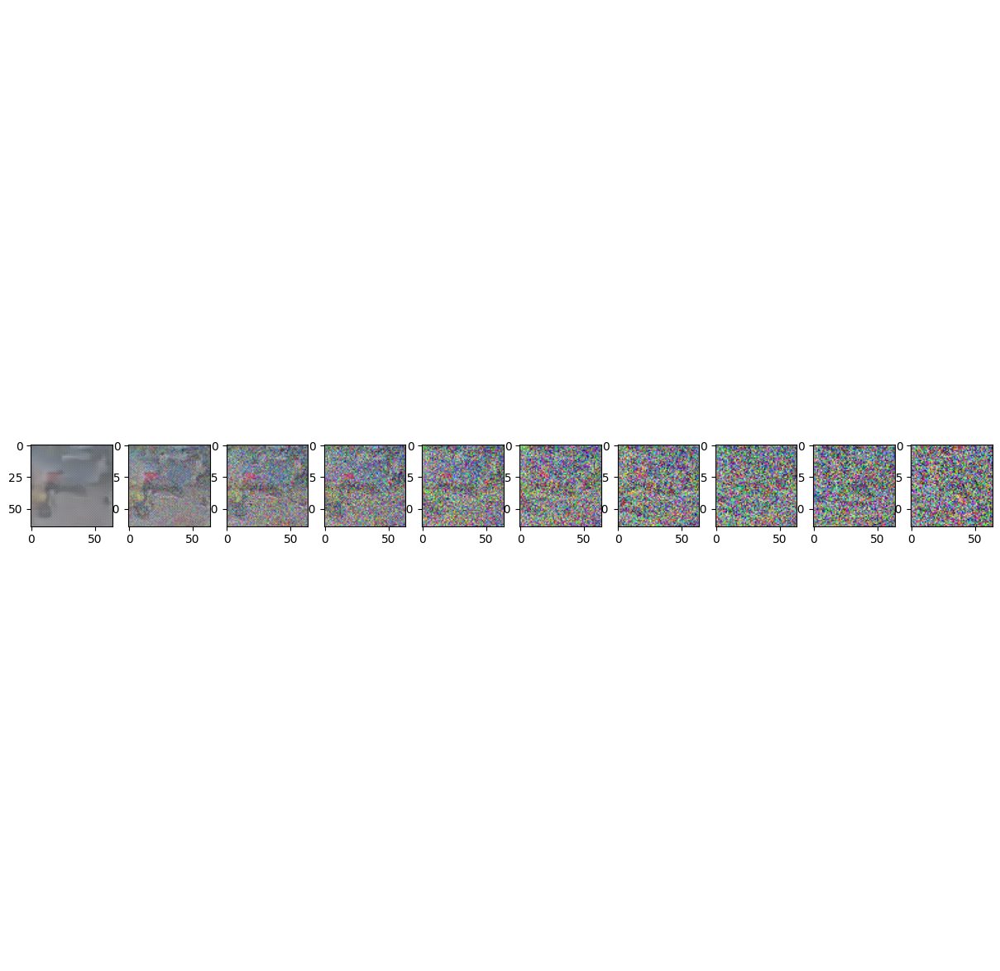

In [ ]:
import torch
from torch.optim import Adam
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

# Asume que model, dataloader, get_loss, sample_plot_image, save_checkpoint están definidos
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)

epochs = 20
T = 300  # Número de pasos de ruido, ajusta según tu modelo
best_loss = float('inf')

# Métricas
fid_metric = FrechetInceptionDistance(feature=2048).to(device)
is_metric = InceptionScore().to(device)
resize_transform = transforms.Resize((299, 299))

fid_scores = []
is_means = []
is_stds = []
epochs_recorded = []

# Entrenamiento
for epoch in range(epochs):
    model.train()
    for step, (x, _) in enumerate(dataloader):
        x = x.to(device)
        optimizer.zero_grad()

        t = torch.randint(0, T, (x.size(0),), device=device).long()
        loss = get_loss(model, x, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.4f}")
            sample_plot_image()

    # Guardar mejor checkpoint
    if loss.item() < best_loss:
        best_loss = loss.item()
        save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar cada 10 épocas
    if epoch % 10 == 0:
        save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

        # Evaluar FID e IS
        model.eval()
        with torch.no_grad():
            num_samples = 100
            real_images = []
            for i, (real_batch, _) in enumerate(dataloader):
                real_images.append(real_batch)
                if len(real_images) * real_batch.size(0) >= num_samples:
                    break
            real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

            fake_images = sample(model, num_samples, img_size=64, T=T, device=device)  # Asegúrate de tener model.sample()

            real_resized = resize_transform(real_images)
            fake_resized = resize_transform(fake_images)

            fid_metric.reset()
            fid_metric.update(preprocess_for_fid(real_resized), real=True)
            fid_metric.update(preprocess_for_fid(fake_resized), real=False)

            fid_score = fid_metric.compute().item()

            is_metric.reset()
            is_metric.update(preprocess_for_fid(fake_resized))
            is_mean, is_std = is_metric.compute()
            is_mean = is_mean.item()
            is_std = is_std.item()

            print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")

            fid_scores.append(fid_score)
            is_means.append(is_mean)
            is_stds.append(is_std)
            epochs_recorded.append(epoch)

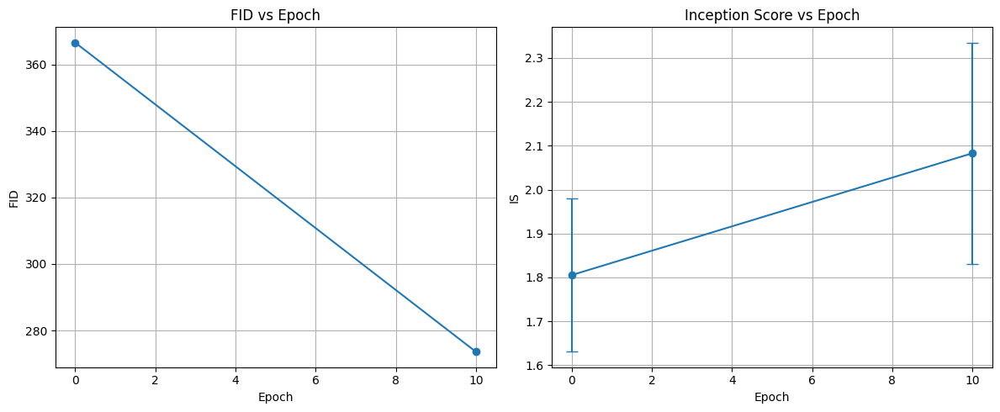

In [ ]:
# === Graficar métricas ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_recorded, fid_scores, marker='o')
plt.title("FID vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("FID")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.errorbar(epochs_recorded, is_means, yerr=is_stds, marker='o', capsize=5)
plt.title("Inception Score vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("IS")
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# === Evaluación final del mejor modelo ===
print("Evaluación final del mejor modelo...")
checkpoint = torch.load("/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth")
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

with torch.no_grad():
    num_samples = 500
    real_images = []
    for i, (real_batch, _) in enumerate(dataloader):
        real_images.append(real_batch)
        if len(real_images) * real_batch.size(0) >= num_samples:
            break
    real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

    fake_images = sample(model, num_samples, img_size=64, T=T, device=device)  # Asegúrate de tener model.sample()

    real_resized = resize_transform(real_images)
    fake_resized = resize_transform(fake_images)

    fid_metric.reset()
    is_metric.reset()
    fid_metric.update(preprocess_for_fid(real_resized), real=True)
    fid_metric.update(preprocess_for_fid(fake_resized), real=False)
    final_fid = fid_metric.compute().item()

    is_metric.update(preprocess_for_fid(fake_resized))
    final_is_mean, final_is_std = is_metric.compute()

    print(f"\n== Resultados Finales ==")
    print(f"FID final: {final_fid:.4f}")
    print(f"Inception Score final: {final_is_mean:.4f} ± {final_is_std:.4f}")

Evaluación final del mejor modelo...

== Resultados Finales ==
FID final: 184.0769
Inception Score final: 2.8142 ± 0.1796


Checkpoint cargado desde '/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth' (época 16)


Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /root/.cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth
100%|██████████| 91.2M/91.2M [00:00<00:00, 307MB/s]
/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


✅ Checkpoint guardado en epoch 17 con loss 0.1370
Epoch 20 | Step 000 | Loss: 0.1332


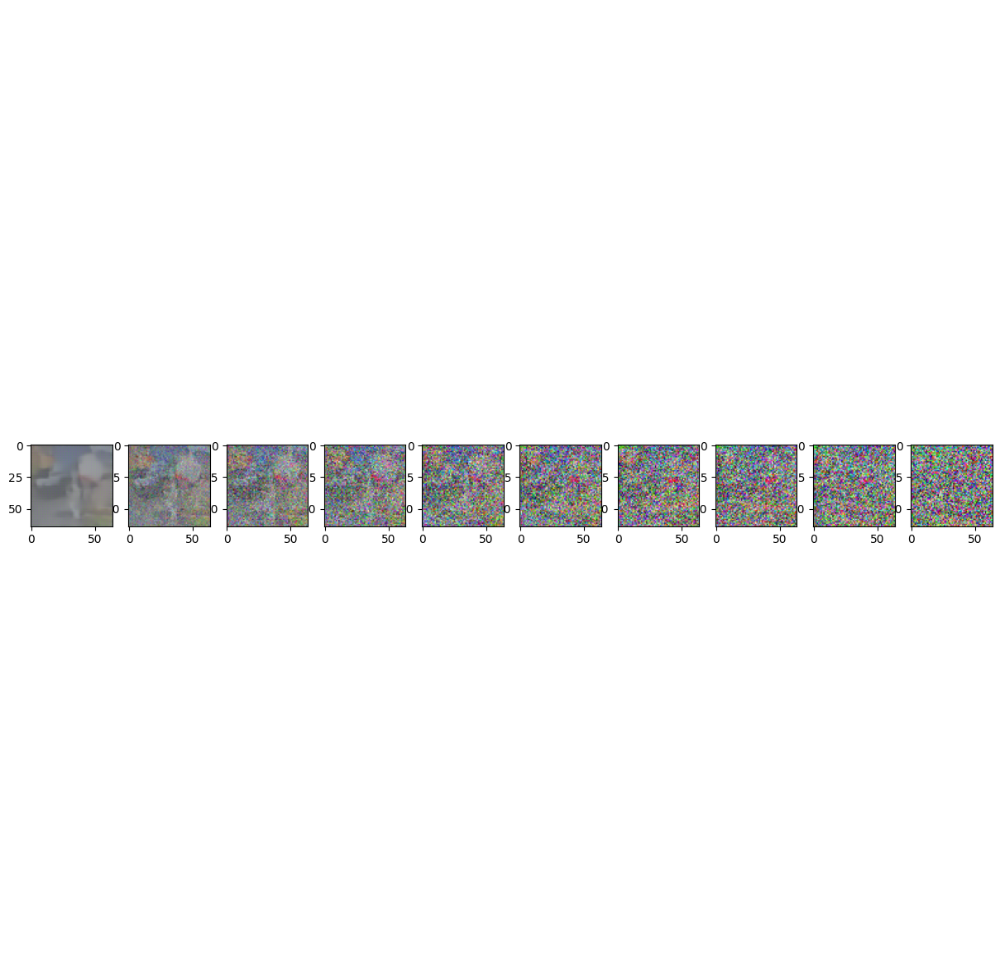

✅ Checkpoint guardado en epoch 20 con loss 0.1540
[Epoch 20] FID: 216.8375 | IS: 2.5656 ± 0.2614
✅ Checkpoint guardado en epoch 22 con loss 0.1361
Epoch 25 | Step 000 | Loss: 0.1527


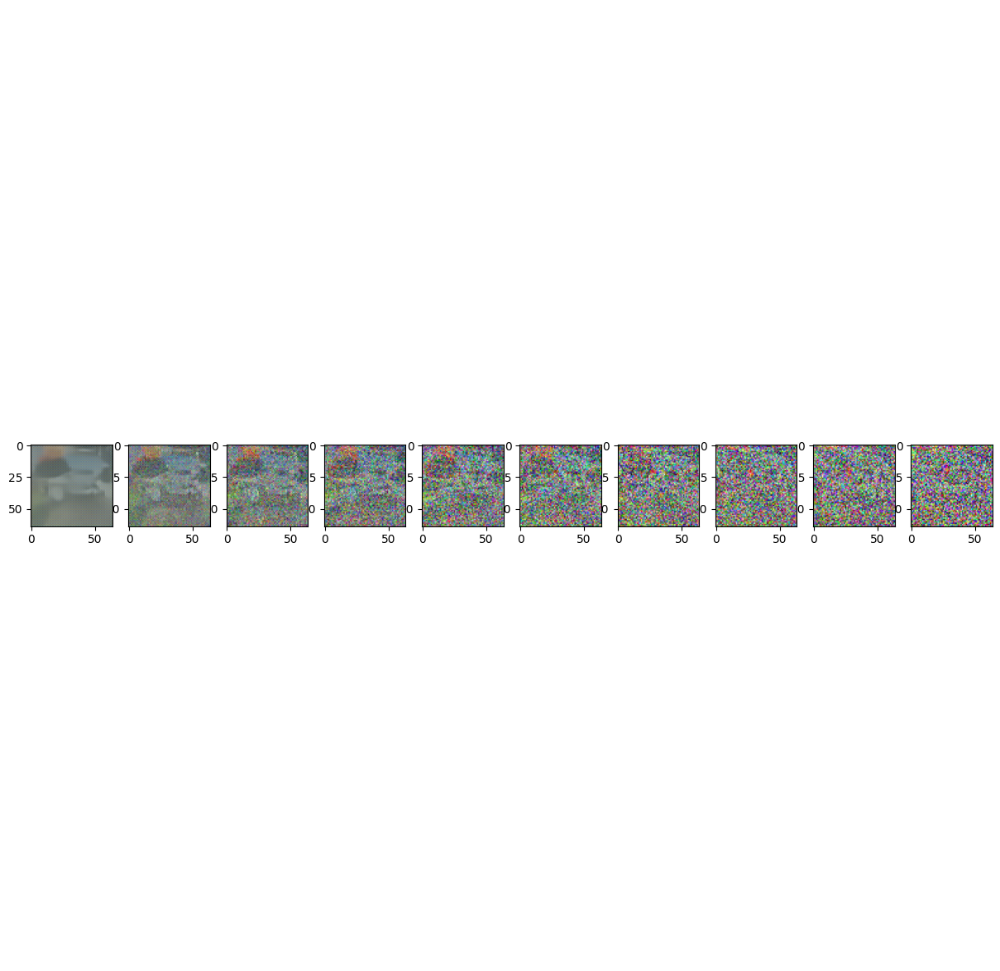

✅ Checkpoint guardado en epoch 26 con loss 0.1340
Epoch 30 | Step 000 | Loss: 0.1330


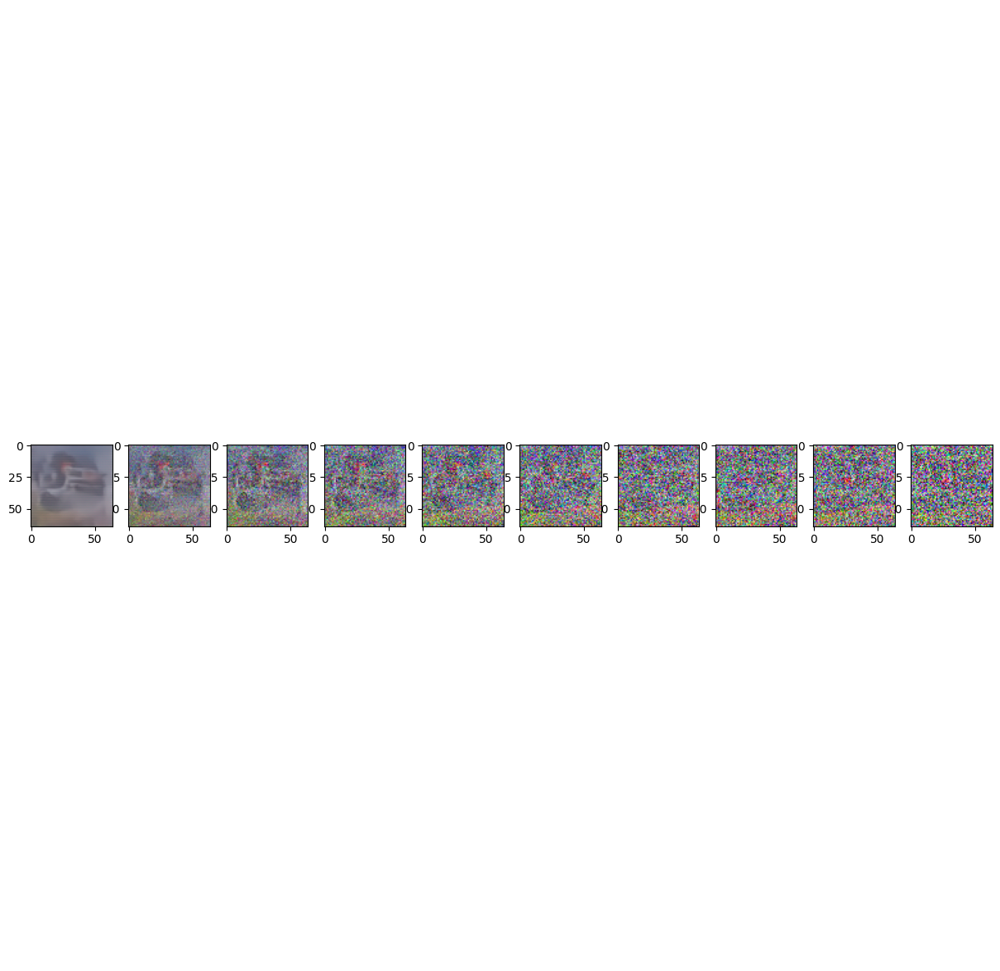

✅ Checkpoint guardado en epoch 30 con loss 0.1424
[Epoch 30] FID: 221.0822 | IS: 2.4031 ± 0.3903
Epoch 35 | Step 000 | Loss: 0.1301


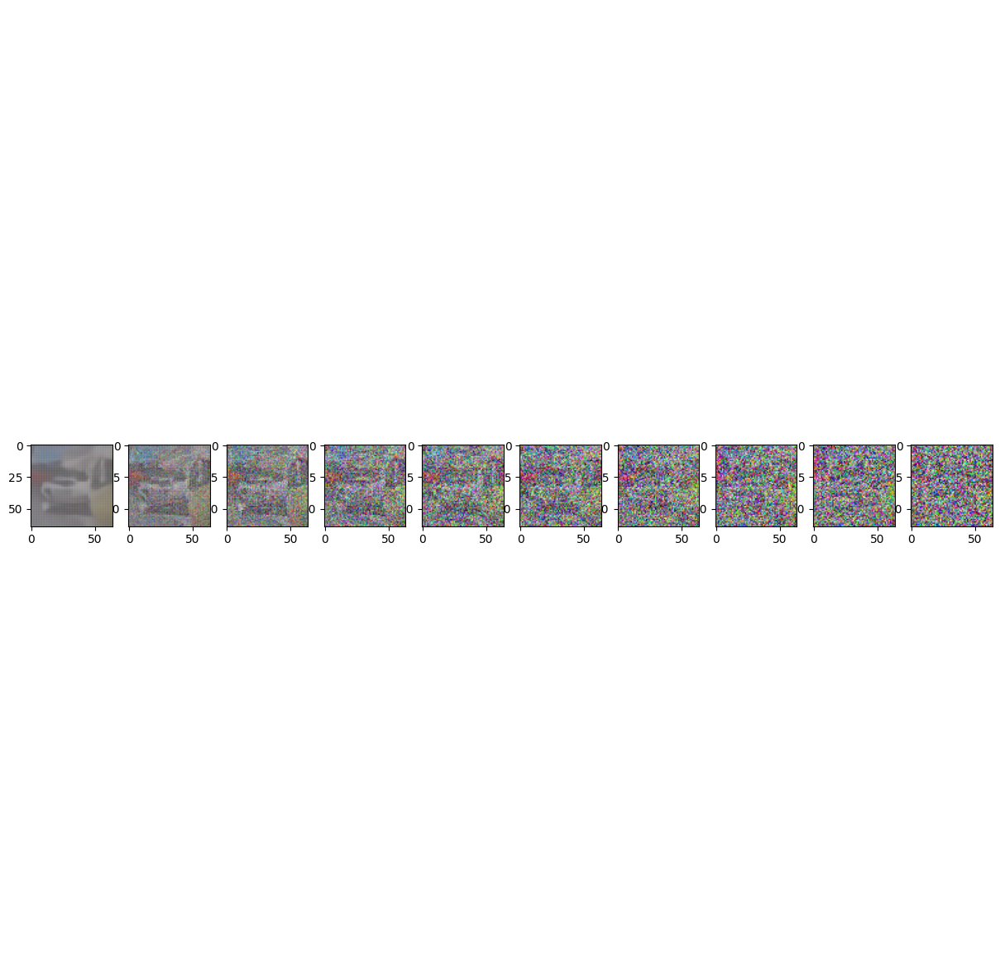

✅ Checkpoint guardado en epoch 35 con loss 0.1252
✅ Checkpoint guardado en epoch 37 con loss 0.1229


In [ ]:
import torch
from torch.optim import Adam
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

# Asume que tienes definidos: model, dataloader, get_loss, sample_plot_image, save_checkpoint, sample, preprocess_for_fid
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)

T = 300  # Pasos de ruido

# Función para cargar checkpoint
def load_checkpoint(model, optimizer, filename):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_loss = checkpoint.get('best_loss', float('inf'))
    print(f"Checkpoint cargado desde '{filename}' (época {start_epoch - 1})")
    return model, optimizer, start_epoch, best_loss

# Cargar desde checkpoint (ajusta el nombre según lo que guardaste)
checkpoint_path = "/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth"  # o "epoch_10.pth", etc.
model, optimizer, start_epoch, best_loss = load_checkpoint(model, optimizer, checkpoint_path)

# Definir métricas
fid_metric = FrechetInceptionDistance(feature=2048).to(device)
is_metric = InceptionScore().to(device)
resize_transform = transforms.Resize((299, 299))

fid_scores = []
is_means = []
is_stds = []
epochs_recorded = []

# Definir hasta qué época continuar
new_total_epochs = 40  # Cambia este número según tus necesidades

# Entrenamiento
for epoch in range(start_epoch, new_total_epochs):
    model.train()
    for step, (x, _) in enumerate(dataloader):
        x = x.to(device)
        optimizer.zero_grad()
        t = torch.randint(0, T, (x.size(0),), device=device).long()
        loss = get_loss(model, x, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.4f}")
            sample_plot_image()

    # Guardar mejor checkpoint
    if loss.item() < best_loss:
        best_loss = loss.item()
        save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar cada 10 épocas y evaluar métricas
    if epoch % 10 == 0:
        save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

        model.eval()
        with torch.no_grad():
            num_samples = 100
            real_images = []
            for i, (real_batch, _) in enumerate(dataloader):
                real_images.append(real_batch)
                if len(real_images) * real_batch.size(0) >= num_samples:
                    break
            real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

            fake_images = sample(model, num_samples, img_size=64, T=T, device=device)

            real_resized = resize_transform(real_images)
            fake_resized = resize_transform(fake_images)

            fid_metric.reset()
            fid_metric.update(preprocess_for_fid(real_resized), real=True)
            fid_metric.update(preprocess_for_fid(fake_resized), real=False)
            fid_score = fid_metric.compute().item()

            is_metric.reset()
            is_metric.update(preprocess_for_fid(fake_resized))
            is_mean, is_std = is_metric.compute()
            is_mean = is_mean.item()
            is_std = is_std.item()

            print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")

            fid_scores.append(fid_score)
            is_means.append(is_mean)
            is_stds.append(is_std)
            epochs_recorded.append(epoch)


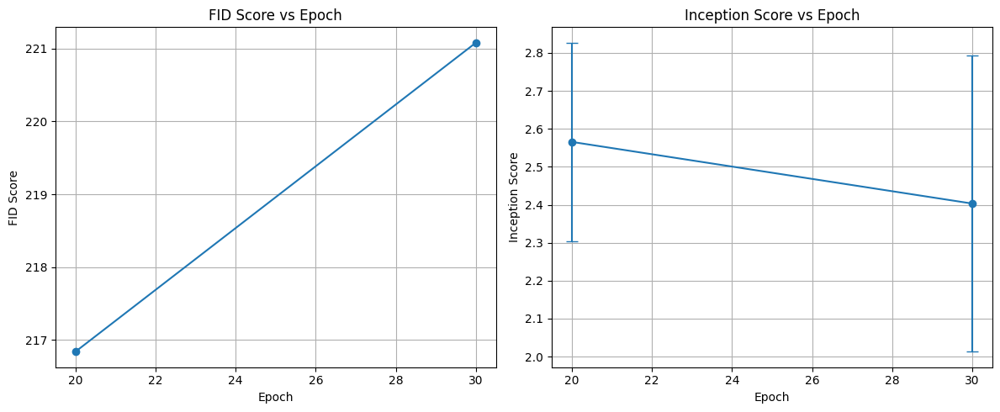

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_recorded, fid_scores, marker='o')
plt.title('FID Score vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.grid()

plt.subplot(1, 2, 2)
plt.errorbar(epochs_recorded, is_means, yerr=is_stds, marker='o', capsize=5)
plt.title('Inception Score vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Inception Score')
plt.grid()

plt.tight_layout()
plt.show()


Checkpoint cargado desde '/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth' (época 37)
✅ Checkpoint guardado en epoch 38 con loss 0.1427
✅ Checkpoint guardado en epoch 39 con loss 0.1365
Epoch 40 | Step 000 | Loss: 0.1604


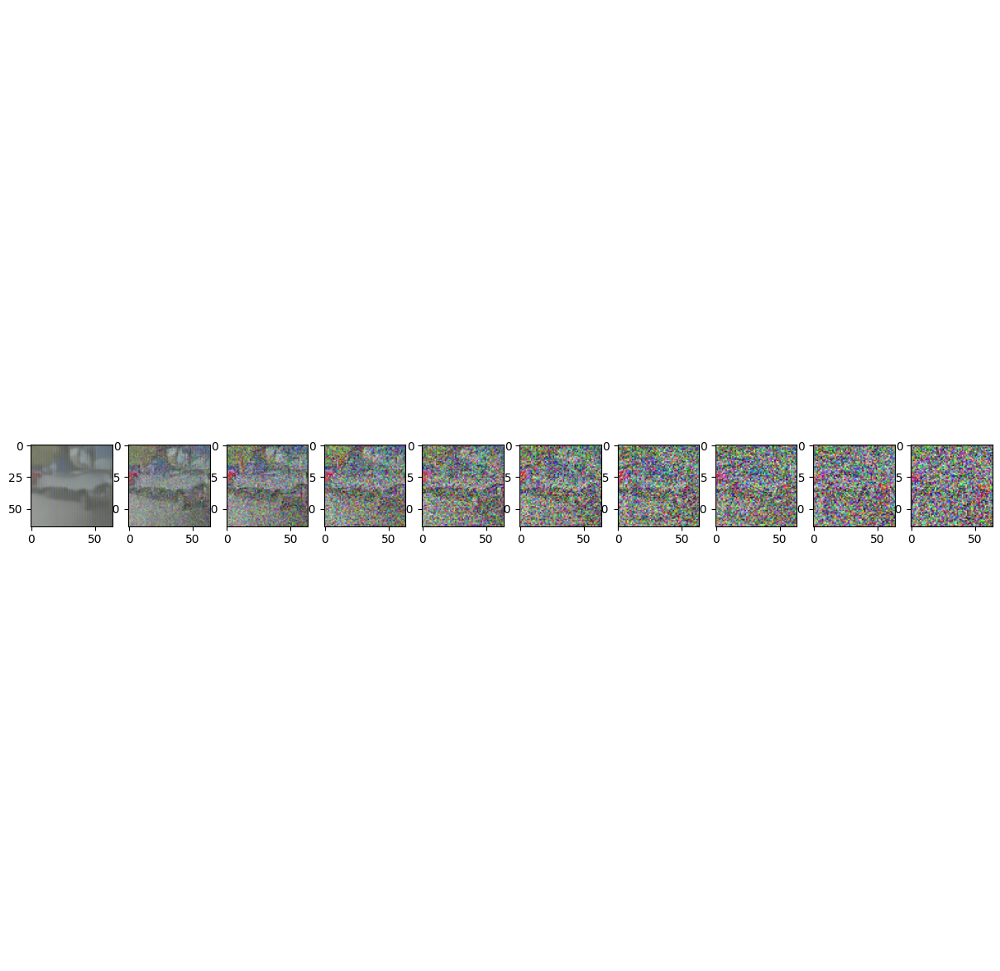

✅ Checkpoint guardado en epoch 40 con loss 0.1223
✅ Checkpoint guardado en epoch 40 con loss 0.1223
[Epoch 40] FID: 199.9698 | IS: 2.6239 ± 0.4257
Epoch 45 | Step 000 | Loss: 0.1364


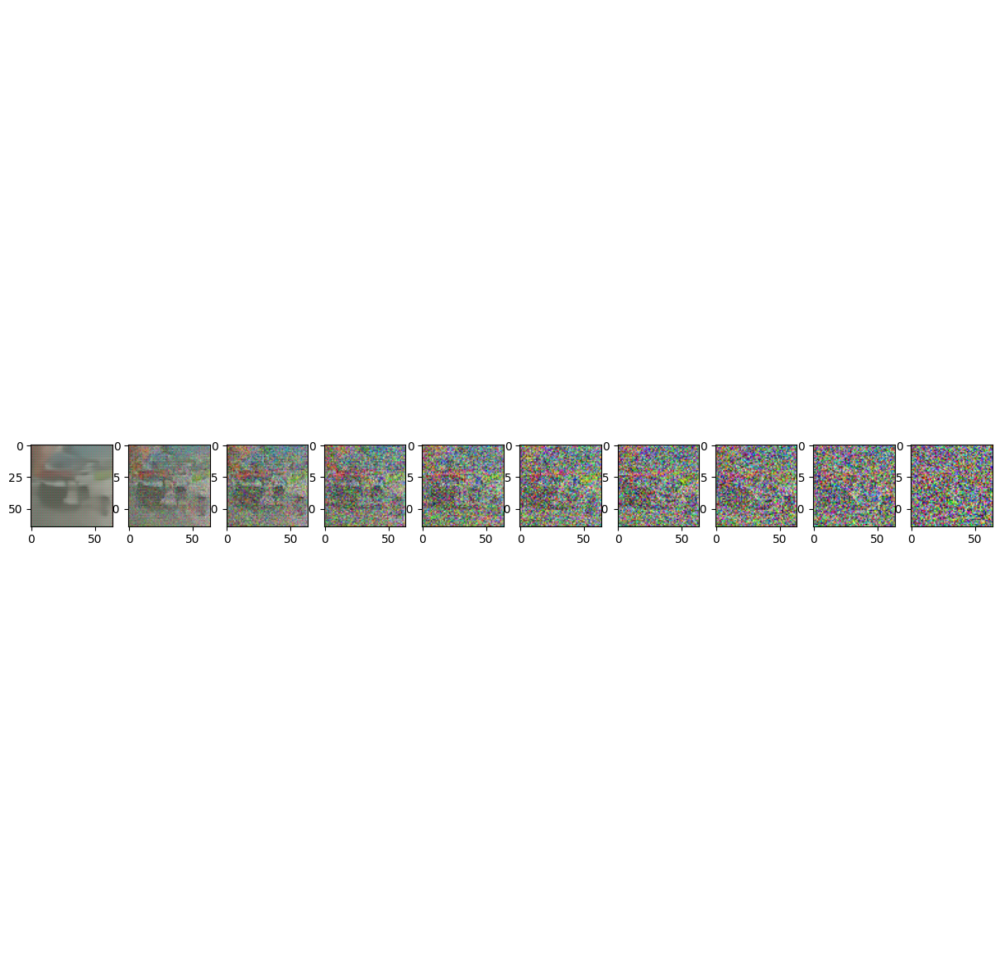

Epoch 50 | Step 000 | Loss: 0.1468


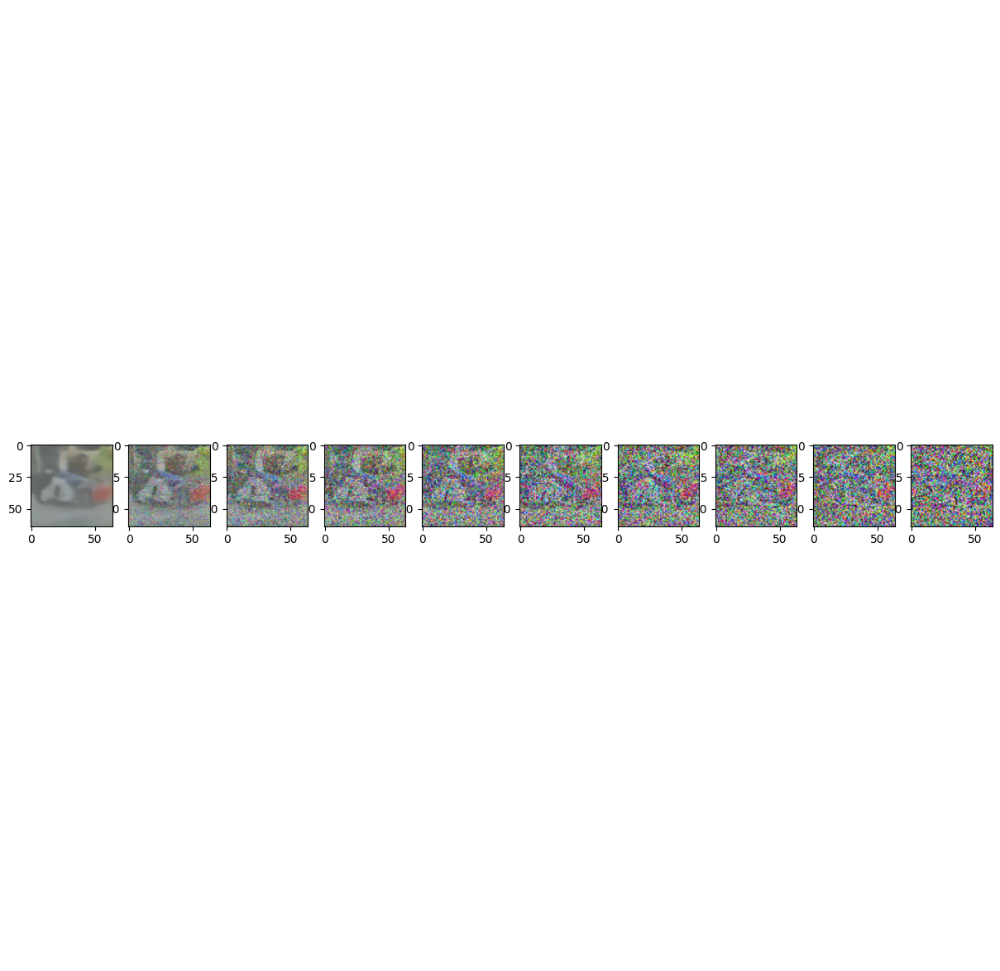

✅ Checkpoint guardado en epoch 50 con loss 0.1310
[Epoch 50] FID: 205.4128 | IS: 2.9174 ± 0.4999


In [ ]:
import torch
from torch.optim import Adam
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

# Asume que tienes definidos: model, dataloader, get_loss, sample_plot_image, save_checkpoint, sample, preprocess_for_fid
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)

T = 300  # Pasos de ruido

# Función para cargar checkpoint
def load_checkpoint(model, optimizer, filename):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_loss = checkpoint.get('best_loss', float('inf'))
    print(f"Checkpoint cargado desde '{filename}' (época {start_epoch - 1})")
    return model, optimizer, start_epoch, best_loss

# Cargar desde checkpoint (ajusta el nombre según lo que guardaste)
checkpoint_path = "/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth"  # o "epoch_10.pth", etc.
model, optimizer, start_epoch, best_loss = load_checkpoint(model, optimizer, checkpoint_path)

# Definir métricas
fid_metric = FrechetInceptionDistance(feature=2048).to(device)
is_metric = InceptionScore().to(device)
resize_transform = transforms.Resize((299, 299))

fid_scores = []
is_means = []
is_stds = []
epochs_recorded = []

# Definir hasta qué época continuar
new_total_epochs = 55  # Cambia este número según tus necesidades

# Entrenamiento
for epoch in range(start_epoch, new_total_epochs):
    model.train()
    for step, (x, _) in enumerate(dataloader):
        x = x.to(device)
        optimizer.zero_grad()
        t = torch.randint(0, T, (x.size(0),), device=device).long()
        loss = get_loss(model, x, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.4f}")
            sample_plot_image()

    # Guardar mejor checkpoint
    if loss.item() < best_loss:
        best_loss = loss.item()
        save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar cada 10 épocas y evaluar métricas
    if epoch % 10 == 0:
        save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

        model.eval()
        with torch.no_grad():
            num_samples = 100
            real_images = []
            for i, (real_batch, _) in enumerate(dataloader):
                real_images.append(real_batch)
                if len(real_images) * real_batch.size(0) >= num_samples:
                    break
            real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

            fake_images = sample(model, num_samples, img_size=64, T=T, device=device)

            real_resized = resize_transform(real_images)
            fake_resized = resize_transform(fake_images)

            fid_metric.reset()
            fid_metric.update(preprocess_for_fid(real_resized), real=True)
            fid_metric.update(preprocess_for_fid(fake_resized), real=False)
            fid_score = fid_metric.compute().item()

            is_metric.reset()
            is_metric.update(preprocess_for_fid(fake_resized))
            is_mean, is_std = is_metric.compute()
            is_mean = is_mean.item()
            is_std = is_std.item()

            print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")

            fid_scores.append(fid_score)
            is_means.append(is_mean)
            is_stds.append(is_std)
            epochs_recorded.append(epoch)


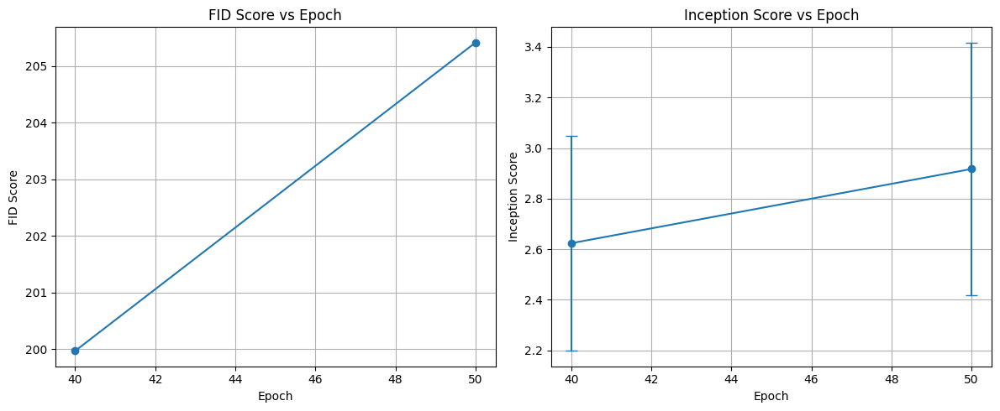

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_recorded, fid_scores, marker='o')
plt.title('FID Score vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('FID Score')
plt.grid()

plt.subplot(1, 2, 2)
plt.errorbar(epochs_recorded, is_means, yerr=is_stds, marker='o', capsize=5)
plt.title('Inception Score vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Inception Score')
plt.grid()

plt.tight_layout()
plt.show()


Checkpoint cargado desde '/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth' (época 40)
✅ Checkpoint guardado en epoch 41 con loss 0.1400
Epoch 45 | Step 000 | Loss: 0.1484


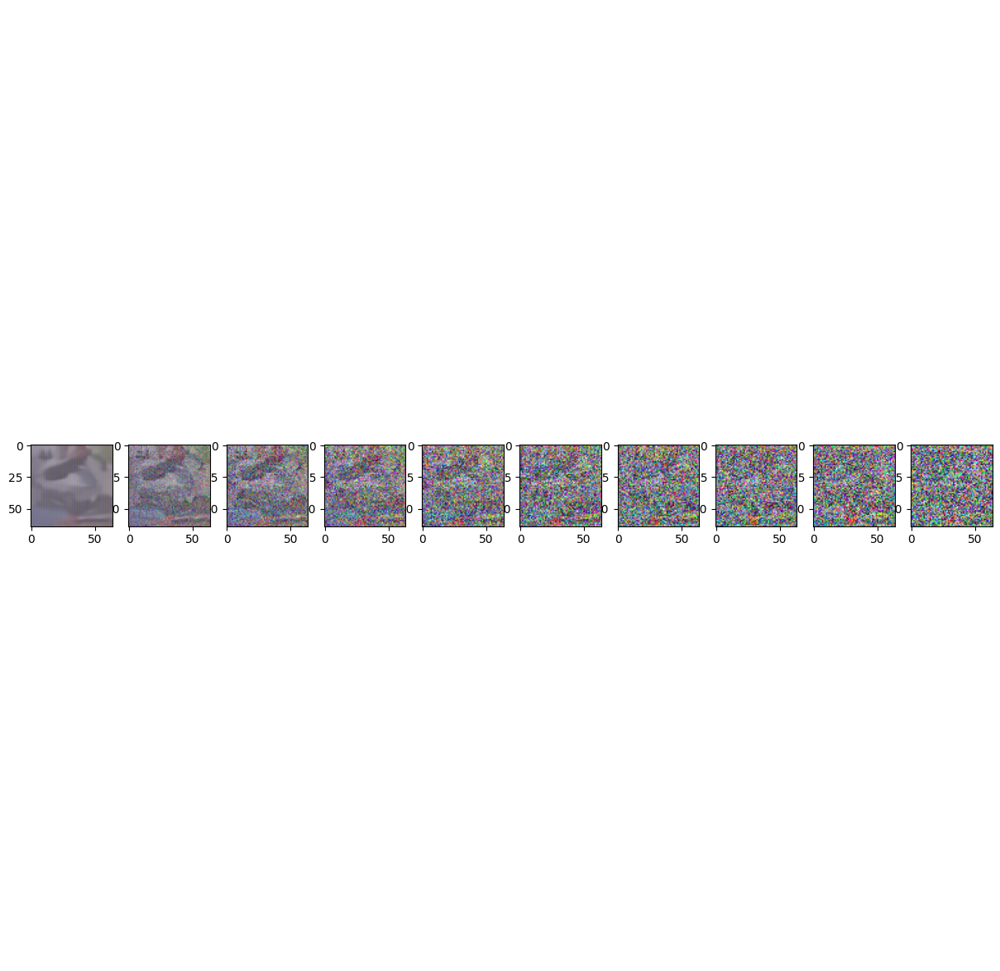

✅ Checkpoint guardado en epoch 45 con loss 0.1363
✅ Checkpoint guardado en epoch 47 con loss 0.1360
✅ Checkpoint guardado en epoch 48 con loss 0.1353
Epoch 50 | Step 000 | Loss: 0.1373


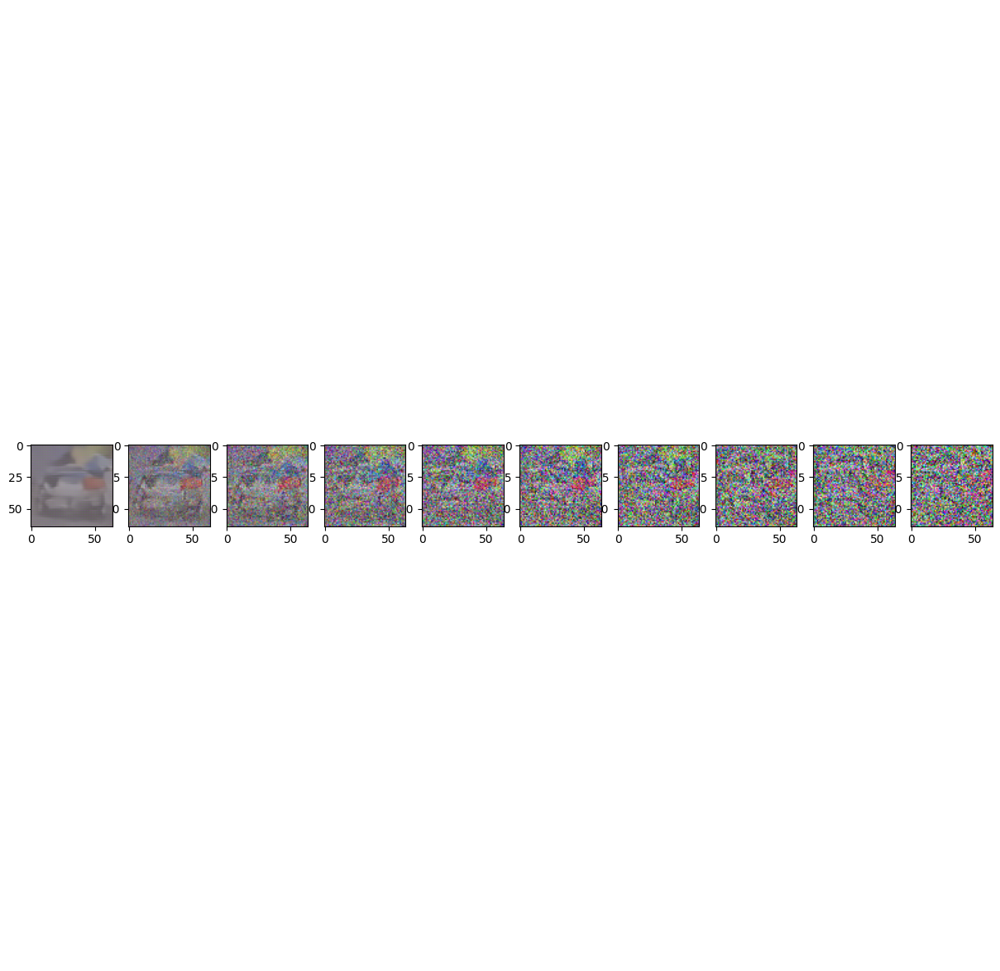

✅ Checkpoint guardado en epoch 50 con loss 0.1388
[Epoch 50] FID: 189.4833 | IS: 2.6820 ± 0.3194
✅ Checkpoint guardado en epoch 51 con loss 0.1272
Epoch 55 | Step 000 | Loss: 0.1322


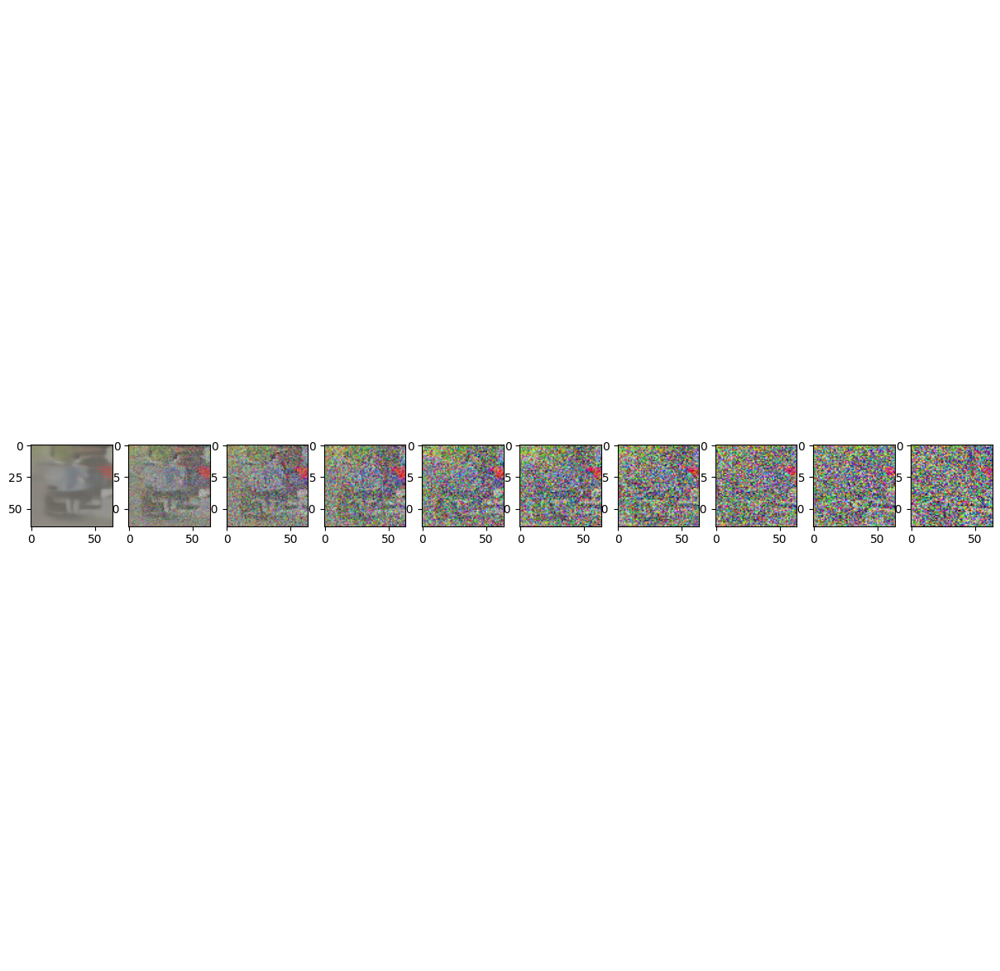

Epoch 60 | Step 000 | Loss: 0.1399


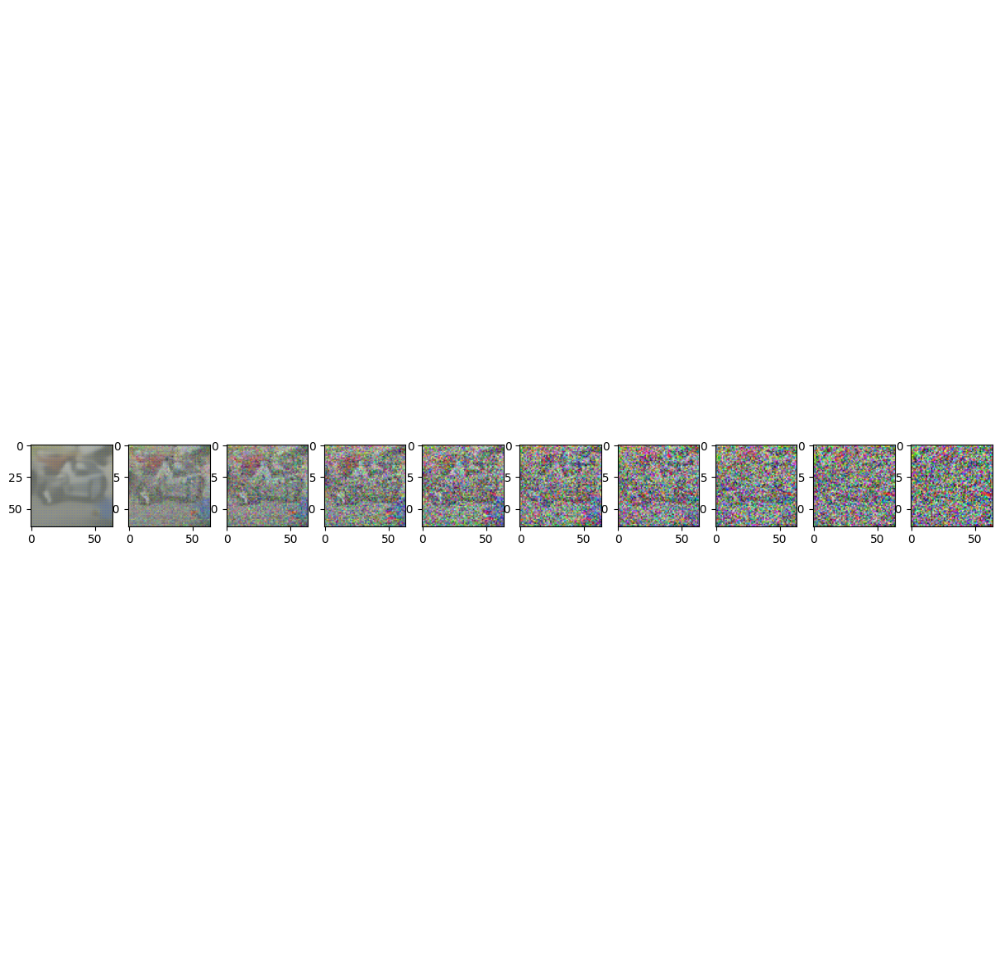

✅ Checkpoint guardado en epoch 60 con loss 0.1239
✅ Checkpoint guardado en epoch 60 con loss 0.1239
[Epoch 60] FID: 226.2373 | IS: 3.1576 ± 0.3961
Epoch 65 | Step 000 | Loss: 0.1412


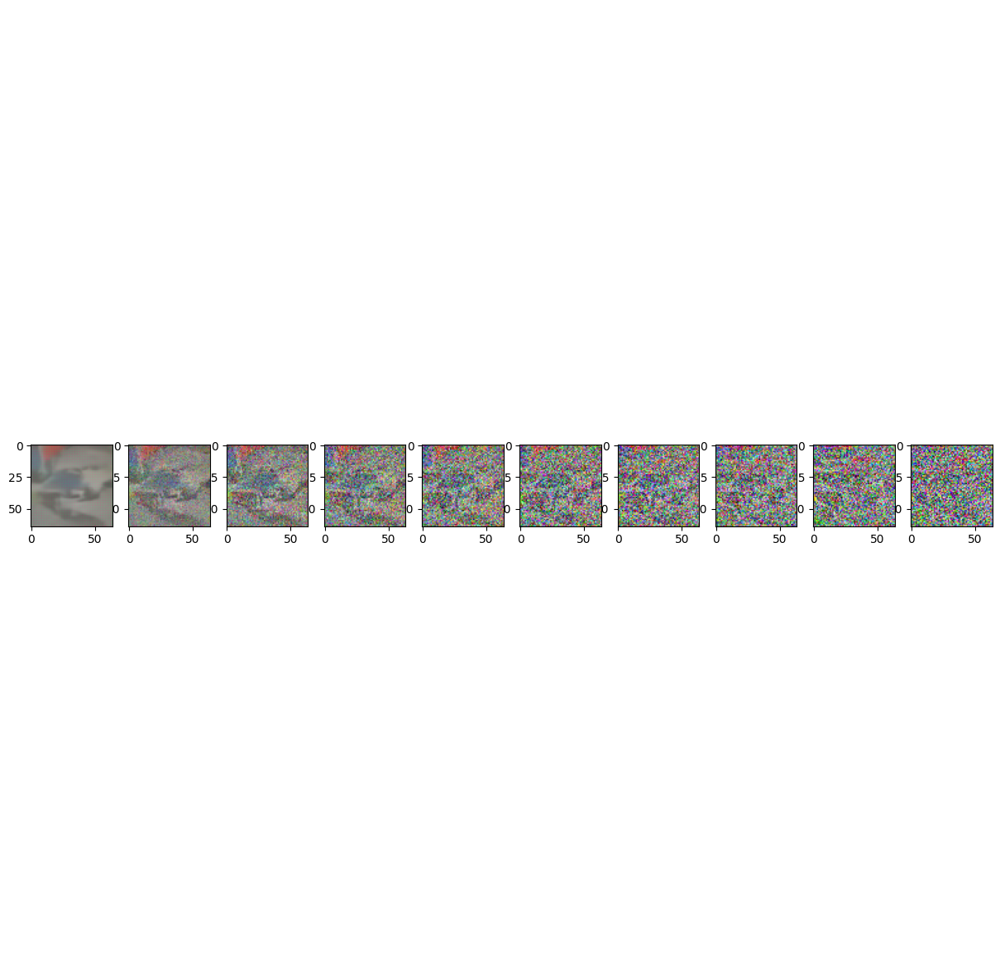

✅ Checkpoint guardado en epoch 65 con loss 0.1239


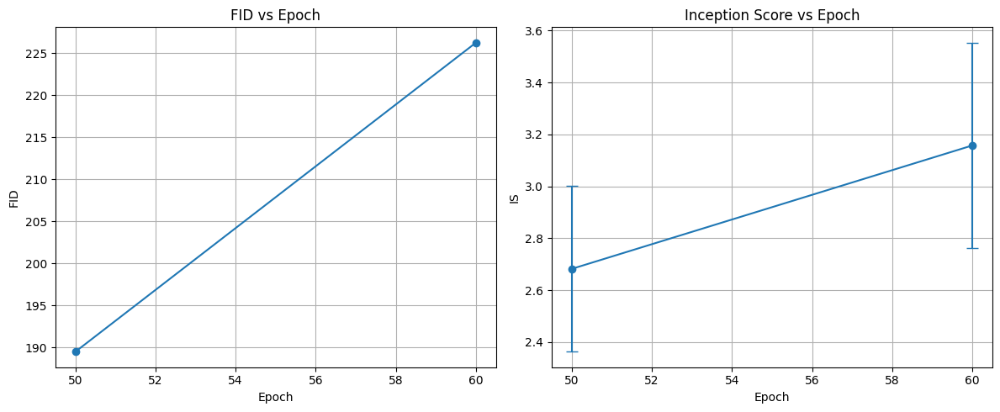

Evaluación final del mejor modelo...

== Resultados Finales ==
FID final: 140.8226
Inception Score final: 3.4893 ± 0.1353


In [ ]:
import torch
from torch.optim import Adam
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

# Asume que tienes definidos: model, dataloader, get_loss, sample_plot_image, save_checkpoint, sample, preprocess_for_fid
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)

T = 300  # Pasos de ruido

# Función para cargar checkpoint
def load_checkpoint(model, optimizer, filename):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_loss = checkpoint.get('best_loss', float('inf'))
    print(f"Checkpoint cargado desde '{filename}' (época {start_epoch - 1})")
    return model, optimizer, start_epoch, best_loss

# Cargar desde checkpoint (ajusta el nombre según lo que guardaste)
checkpoint_path = "/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth"  # o "epoch_10.pth", etc.
model, optimizer, start_epoch, best_loss = load_checkpoint(model, optimizer, checkpoint_path)

# Definir métricas
fid_metric = FrechetInceptionDistance(feature=2048).to(device)
is_metric = InceptionScore().to(device)
resize_transform = transforms.Resize((299, 299))

fid_scores = []
is_means = []
is_stds = []
epochs_recorded = []

# Definir hasta qué época continuar
new_total_epochs = 70  # Cambia este número según tus necesidades

# Entrenamiento
for epoch in range(start_epoch, new_total_epochs):
    model.train()
    for step, (x, _) in enumerate(dataloader):
        x = x.to(device)
        optimizer.zero_grad()
        t = torch.randint(0, T, (x.size(0),), device=device).long()
        loss = get_loss(model, x, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.4f}")
            sample_plot_image()

    # Guardar mejor checkpoint
    if loss.item() < best_loss:
        best_loss = loss.item()
        save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar cada 10 épocas y evaluar métricas
    if epoch % 10 == 0:
        save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

        model.eval()
        with torch.no_grad():
            num_samples = 100
            real_images = []
            for i, (real_batch, _) in enumerate(dataloader):
                real_images.append(real_batch)
                if len(real_images) * real_batch.size(0) >= num_samples:
                    break
            real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

            fake_images = sample(model, num_samples, img_size=64, T=T, device=device)

            real_resized = resize_transform(real_images)
            fake_resized = resize_transform(fake_images)

            fid_metric.reset()
            fid_metric.update(preprocess_for_fid(real_resized), real=True)
            fid_metric.update(preprocess_for_fid(fake_resized), real=False)
            fid_score = fid_metric.compute().item()

            is_metric.reset()
            is_metric.update(preprocess_for_fid(fake_resized))
            is_mean, is_std = is_metric.compute()
            is_mean = is_mean.item()
            is_std = is_std.item()

            print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")

            fid_scores.append(fid_score)
            is_means.append(is_mean)
            is_stds.append(is_std)
            epochs_recorded.append(epoch)

# === Graficar métricas ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_recorded, fid_scores, marker='o')
plt.title("FID vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("FID")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.errorbar(epochs_recorded, is_means, yerr=is_stds, marker='o', capsize=5)
plt.title("Inception Score vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("IS")
plt.grid(True)

plt.tight_layout()
plt.show()

# === Evaluación final del mejor modelo ===
print("Evaluación final del mejor modelo...")
checkpoint = torch.load("/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth")
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

with torch.no_grad():
    num_samples = 500
    real_images = []
    for i, (real_batch, _) in enumerate(dataloader):
        real_images.append(real_batch)
        if len(real_images) * real_batch.size(0) >= num_samples:
            break
    real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

    fake_images = sample(model, num_samples, img_size=64, T=T, device=device)  # Asegúrate de tener model.sample()

    real_resized = resize_transform(real_images)
    fake_resized = resize_transform(fake_images)

    fid_metric.reset()
    is_metric.reset()
    fid_metric.update(preprocess_for_fid(real_resized), real=True)
    fid_metric.update(preprocess_for_fid(fake_resized), real=False)
    final_fid = fid_metric.compute().item()

    is_metric.update(preprocess_for_fid(fake_resized))
    final_is_mean, final_is_std = is_metric.compute()

    print(f"\n== Resultados Finales ==")
    print(f"FID final: {final_fid:.4f}")
    print(f"Inception Score final: {final_is_mean:.4f} ± {final_is_std:.4f}")

Checkpoint cargado desde '/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth' (época 65)
✅ Checkpoint guardado en epoch 66 con loss 0.1322
Epoch 70 | Step 000 | Loss: 0.1415


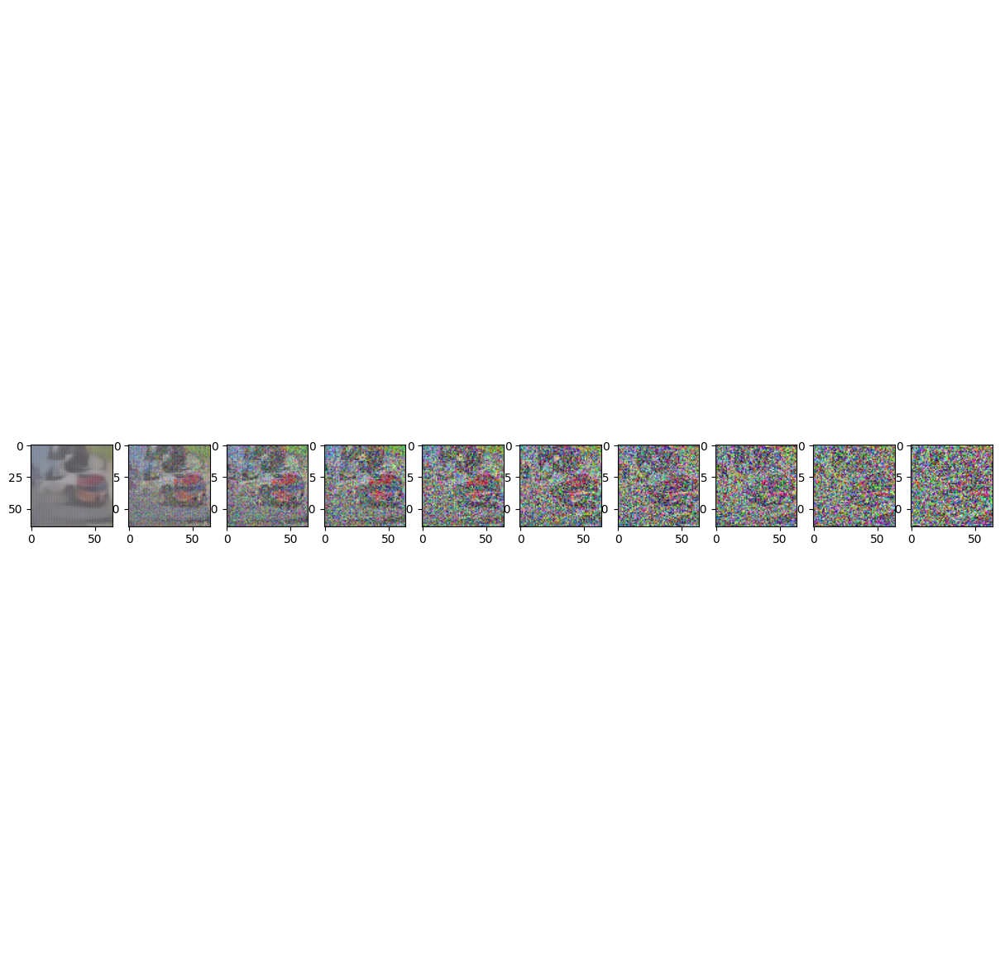

✅ Checkpoint guardado en epoch 70 con loss 0.1308
✅ Checkpoint guardado en epoch 70 con loss 0.1308
[Epoch 70] FID: 202.8867 | IS: 2.9169 ± 0.3546
✅ Checkpoint guardado en epoch 71 con loss 0.1306
✅ Checkpoint guardado en epoch 74 con loss 0.1222
Epoch 75 | Step 000 | Loss: 0.1319


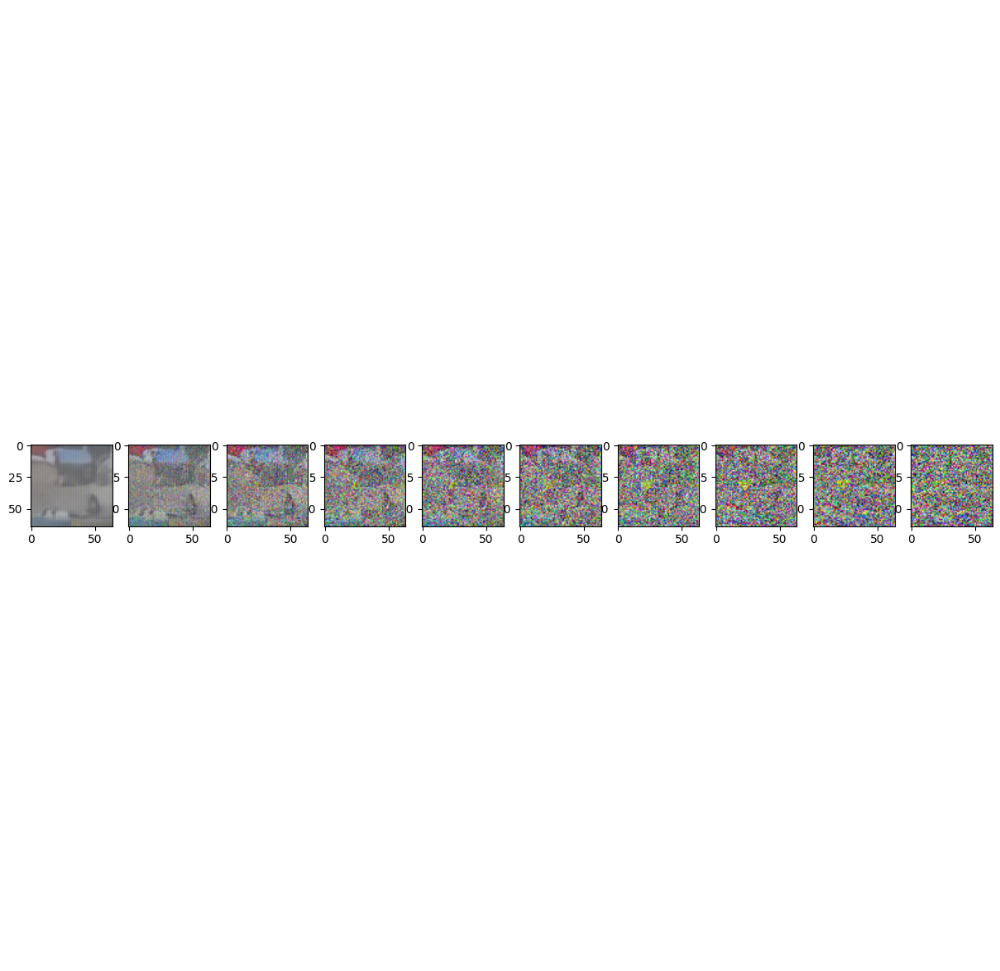

In [ ]:
import torch
from torch.optim import Adam
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

# Asume que tienes definidos: model, dataloader, get_loss, sample_plot_image, save_checkpoint, sample, preprocess_for_fid
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)

T = 300  # Pasos de ruido

# Función para cargar checkpoint
def load_checkpoint(model, optimizer, filename):
    checkpoint = torch.load(filename, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch'] + 1
    best_loss = checkpoint.get('best_loss', float('inf'))
    print(f"Checkpoint cargado desde '{filename}' (época {start_epoch - 1})")
    return model, optimizer, start_epoch, best_loss

# Cargar desde checkpoint (ajusta el nombre según lo que guardaste)
checkpoint_path = "/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth"  # o "epoch_10.pth", etc.
model, optimizer, start_epoch, best_loss = load_checkpoint(model, optimizer, checkpoint_path)

# Definir métricas
fid_metric = FrechetInceptionDistance(feature=2048).to(device)
is_metric = InceptionScore().to(device)
resize_transform = transforms.Resize((299, 299))

fid_scores = []
is_means = []
is_stds = []
epochs_recorded = []

# Definir hasta qué época continuar
new_total_epochs = 90  # Cambia este número según tus necesidades

# Entrenamiento
for epoch in range(start_epoch, new_total_epochs):
    model.train()
    for step, (x, _) in enumerate(dataloader):
        x = x.to(device)
        optimizer.zero_grad()
        t = torch.randint(0, T, (x.size(0),), device=device).long()
        loss = get_loss(model, x, t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | Step {step:03d} | Loss: {loss.item():.4f}")
            sample_plot_image()

    # Guardar mejor checkpoint
    if loss.item() < best_loss:
        best_loss = loss.item()
        save_checkpoint(model, optimizer, epoch, best_loss, filename="best_model.pth")

    # Guardar cada 10 épocas y evaluar métricas
    if epoch % 10 == 0:
        save_checkpoint(model, optimizer, epoch, loss.item(), filename=f"epoch_{epoch}.pth")

        model.eval()
        with torch.no_grad():
            num_samples = 100
            real_images = []
            for i, (real_batch, _) in enumerate(dataloader):
                real_images.append(real_batch)
                if len(real_images) * real_batch.size(0) >= num_samples:
                    break
            real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

            fake_images = sample(model, num_samples, img_size=64, T=T, device=device)

            real_resized = resize_transform(real_images)
            fake_resized = resize_transform(fake_images)

            fid_metric.reset()
            fid_metric.update(preprocess_for_fid(real_resized), real=True)
            fid_metric.update(preprocess_for_fid(fake_resized), real=False)
            fid_score = fid_metric.compute().item()

            is_metric.reset()
            is_metric.update(preprocess_for_fid(fake_resized))
            is_mean, is_std = is_metric.compute()
            is_mean = is_mean.item()
            is_std = is_std.item()

            print(f"[Epoch {epoch}] FID: {fid_score:.4f} | IS: {is_mean:.4f} ± {is_std:.4f}")

            fid_scores.append(fid_score)
            is_means.append(is_mean)
            is_stds.append(is_std)
            epochs_recorded.append(epoch)

# === Graficar métricas ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_recorded, fid_scores, marker='o')
plt.title("FID vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("FID")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.errorbar(epochs_recorded, is_means, yerr=is_stds, marker='o', capsize=5)
plt.title("Inception Score vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("IS")
plt.grid(True)

plt.tight_layout()
plt.show()

# === Evaluación final del mejor modelo ===
print("Evaluación final del mejor modelo...")
checkpoint = torch.load("/content/drive/MyDrive/SIS421/Dataset/Checkpoints/best_model.pth")
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

with torch.no_grad():
    num_samples = 500
    real_images = []
    for i, (real_batch, _) in enumerate(dataloader):
        real_images.append(real_batch)
        if len(real_images) * real_batch.size(0) >= num_samples:
            break
    real_images = torch.cat(real_images, dim=0)[:num_samples].to(device)

    fake_images = sample(model, num_samples, img_size=64, T=T, device=device)  # Asegúrate de tener model.sample()

    real_resized = resize_transform(real_images)
    fake_resized = resize_transform(fake_images)

    fid_metric.reset()
    is_metric.reset()
    fid_metric.update(preprocess_for_fid(real_resized), real=True)
    fid_metric.update(preprocess_for_fid(fake_resized), real=False)
    final_fid = fid_metric.compute().item()

    is_metric.update(preprocess_for_fid(fake_resized))
    final_is_mean, final_is_std = is_metric.compute()

    print(f"\n== Resultados Finales ==")
    print(f"FID final: {final_fid:.4f}")
    print(f"Inception Score final: {final_is_mean:.4f} ± {final_is_std:.4f}")